In [1]:
# Disable GPU
import os
os.environ['CUDA_VISIBLE_DEVICES'] = ''

In [2]:
import os
import sys
import glob
import json
import pickle
import copy
import itertools
from functools import partial
from multiprocessing import Pool

import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from scipy.stats import skew, gaussian_kde

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from matplotlib.ticker import FuncFormatter, ScalarFormatter

from IPython.display import display

import bayesflow as bf

import functions_param_estim_s2 as prior_simulator_functions

#%load_ext autoreload
#%autoreload 2

2026-02-22 14:26:05.582615: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-22 14:26:05.598821: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2026-02-22 14:26:05.598842: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-02-22 14:26:05.598855: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2026-02-22 14:26:05.603279: I tensorflow/core/platform/cpu_feature_g

# Check Functions

In [3]:
params = prior_simulator_functions.levy_prior(False, 32)[1]
params

array([ 0.64579415,  0.34829316,  0.5593502 , -1.9831734 ,  0.61643815,
        3.0460021 ,  1.2246299 ,  0.04180532,  0.59023935], dtype=float32)

In [4]:
ndt, st0, zr, v0, v1, a, alpha, szr, sv = params
prior_simulator_functions.diffusion_trial(ndt, st0, zr, v0, a, alpha,szr, sv, False)

0.8809205182362441

In [5]:
prior_simulator_functions.ddm_simulator(params, 10, deadline=False)

array([[ 0.78218874,  0.        ],
       [-1.23666846,  0.        ],
       [-2.26812435,  0.        ],
       [-0.94197593,  0.        ],
       [-1.55554928,  0.        ],
       [ 1.24017384,  1.        ],
       [-2.65285028,  1.        ],
       [ 3.75610224,  1.        ],
       [-1.5818296 ,  1.        ],
       [ 1.57952604,  1.        ]])

# Set Constants

In [6]:
# Generative model
PARAM_NAMES = ['t0', 'st0', 'zr', 'v0',  'v1', 'a', 'alpha', 'szr', 'sv']
PARAM_LABELS = [r"$t_0$", r"$s_{t_0}$", r"$z_r$", r"$v_{0}$", r"$v_{1}$", r"$a$", r"$\alpha$",
               r"$s_{z_r}$", r"$s_{v}$"]
PRIOR_CONTEXTS =  ["levy"]
model_map = {"levy": "Lévy-flight"}
SIMULATOR_CONTEXTS = ["no_deadline"] #["no_deadline", "deadline"]

# Neural networks
NUM_ENSEMBLE_MEMBERS = 2
NUM_ITERATIONS_PER_EPOCH = 10000
BATCH_SIZE = 32
SUMMARY_NET_SETTINGS = {
    "summary_dim" : 20, #16,
    "num_dense_s1" : 3,
    "num_dense_s2" : 3,
    "num_dense_s3" : 3,
    "num_dense_equivariant" : 3
}

# Validation
NUM_COMBINATIONS = len(PRIOR_CONTEXTS) * len(SIMULATOR_CONTEXTS)
NUM_VAL_SIMS_PER_COMBINATION = 500
NUM_VAL_SAMPLES = 1000
NUM_VAL_OBS = 400

# Global
NUM_EPOCHS = 250
TRAINING_MODE = "presimulation" #online
MY_NAME = "ttj_s2_" + TRAINING_MODE + "_" + str(NUM_EPOCHS) + "ep_" + str(NUM_ITERATIONS_PER_EPOCH) + 'it_' + '_'.join(PRIOR_CONTEXTS + SIMULATOR_CONTEXTS) 
MY_DPI = 300 #600

# Presimulation (irrelevant if online training is used)
RUNNER = "pc2" #"pc1"
PRESIM_PATH = ""
NUM_PROCESSES = 25 

print(MY_NAME)

ttj_s2_presimulation_250ep_10000it_levy_no_deadline


# Generative Model

Careful: Context is implemented batch-wise, so all data sets of a batch will have the same context. 
I.e., the same number of observations, the same computational model (Levy or DDM), and the same deadline condition (no deadline or deadline).
That means that e.g., generative_model(1000) will simulate all data sets from a single combination of those constellations!
See validation part below for getting samples under all combinations.

In [7]:
def binary_context_generator():
    """ 
    Generates binary context indicators for joint parameter estimation.
    Prior context: 0 = Levy, 1 = DDM.
    Simulator context: 0 = no deadline, 1 = deadline.
    """
    return np.random.binomial(n=1, p=0.5)
def prior_context_generator():
    """
    Generates a fixed context indicator based on the global PRIOR_CONTEXTS variable.
    Returns:
        int: Fixed context value (0 for "levy", 1 for "ddm").
    """
    return 0 if PRIOR_CONTEXTS == ["levy"] else 1
def simulator_context_generator():
    """
    Generates a fixed context indicator based on the global SIMULATOR_CONTEXTS variable.
    Returns:
        int: Fixed context value (0 for "no_deadline", 1 for "deadline").
    """
    return 0 if SIMULATOR_CONTEXTS == ["no_deadline"] else 1

In [8]:
# Determine the appropriate context generator functions based on the number of combinations
# and potentially the length of context-specific lists (PRIOR_CONTEXTS).
if NUM_COMBINATIONS == 1:
    # Use dedicated context generators for debugging or single-context scenarios.
    prior_fun = prior_context_generator
    simulator_fun = simulator_context_generator
elif NUM_COMBINATIONS == 2:
    # Choose between specific or binary context generators based on the length of PRIOR_CONTEXTS.
    # This allows for a mix of deterministic and randomized contexts depending on the setup.
    prior_fun = prior_context_generator if len(PRIOR_CONTEXTS) == 1 else binary_context_generator
    simulator_fun = binary_context_generator if len(PRIOR_CONTEXTS) == 1 else simulator_context_generator
else:  # NUM_COMBINATIONS == 4
    # In scenarios requiring a broader range of combinations, use binary context generators for both.
    prior_fun = simulator_fun = binary_context_generator

In [9]:
# Assign the context generators to create the context generator objects.
my_prior_context_generator = bf.simulation.ContextGenerator(non_batchable_context_fun=prior_fun)
my_simulator_context_generator = bf.simulation.ContextGenerator(non_batchable_context_fun=simulator_fun) if NUM_COMBINATIONS != 4 else my_prior_context_generator

# Prior
prior = bf.simulation.Prior(
    batch_prior_fun=prior_simulator_functions.levy_prior, 
    context_generator=my_prior_context_generator,
    param_names=PARAM_NAMES
)

# Simulator
simulator = bf.simulation.Simulator(
    batch_simulator_fun=prior_simulator_functions.batch_simulator,
    context_generator=my_simulator_context_generator
)

# Combine the prior and simulator into a GenerativeModel.
generative_model = bf.simulation.GenerativeModel(prior=prior, simulator=simulator)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 9)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 303, 2)
INFO:root:Could not determine shape of prior non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional simulation batchable context provided.


In [10]:
prior(batch_size=2)  # For the DDM, alpha = 2 during simulation -> replaced by a sample from dummy standard normal during configuration

{'prior_draws': array([[ 0.74592876,  0.45341328,  0.75541776, -1.2377579 ,  2.6981819 ,
          0.59085107,  1.7191956 ,  0.07810345,  0.7946727 ],
        [ 0.8315462 ,  0.10447466,  0.60670906, -1.168812  ,  1.4018666 ,
          0.8588016 ,  1.1995175 ,  0.24900599,  0.34115225]],
       dtype=float32),
 'batchable_context': None,
 'non_batchable_context': 0}

In [11]:
sim_data = generative_model(batch_size=2)
sim_data

{'prior_non_batchable_context': 0,
 'prior_batchable_context': None,
 'prior_draws': array([[ 0.4179926 ,  0.07305516,  0.36171603, -2.6985664 ,  0.37813336,
          2.5551205 ,  1.3444939 ,  0.3662586 ,  0.07000417],
        [ 0.87940943,  0.28626785,  0.373135  , -0.8741075 ,  1.5354484 ,
          1.247083  ,  1.7678769 ,  0.01995276,  1.2335433 ]],
       dtype=float32),
 'sim_non_batchable_context': 0,
 'sim_batchable_context': None,
 'sim_data': array([[[-0.8562565 ,  0.        ],
         [-0.74430144,  0.        ],
         [-0.6816605 ,  0.        ],
         ...,
         [-1.87207   ,  1.        ],
         [ 3.2433982 ,  1.        ],
         [ 2.370012  ,  1.        ]],
 
        [[ 0.94043434,  0.        ],
         [ 0.99529237,  0.        ],
         [-1.1209892 ,  0.        ],
         ...,
         [-1.1066769 ,  1.        ],
         [-1.1220714 ,  1.        ],
         [-1.1529286 ,  1.        ]]], dtype=float32)}

# Prior Checks

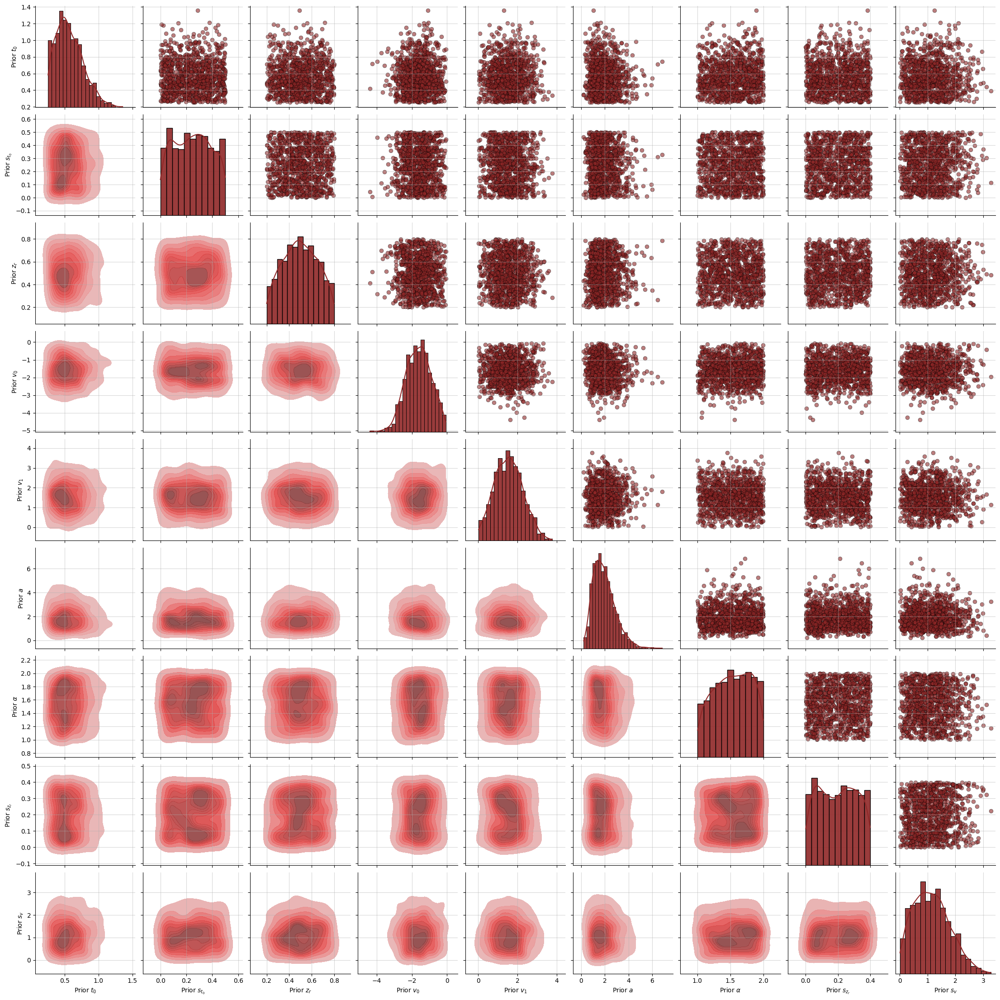

In [12]:
check_levy_prior = bf.simulation.Prior(
    batch_prior_fun=prior_simulator_functions.levy_prior, 
    context_generator=bf.simulation.ContextGenerator(non_batchable_context_fun=lambda: 0),
    param_names=PARAM_LABELS)
plot = check_levy_prior.plot_prior2d(n_samples=1000)

In [13]:
import functions_model_comp as prior_simulator_functions_s1

full_levy_prior_samples_s1 = prior_simulator_functions_s1.levy_prior(fix_alpha=False,
                                                                     fix_st0=False,fix_szr=False,fix_sv=False,
                                                                     batch_size=10000)
full_levy_prior_samples_s2 = prior_simulator_functions.levy_prior(fix_alpha=False, batch_size=10000)

OLD_PARAM_LABELS = [r"$t_0$", r"$s_{t_0}$", r"$z_r$", r"$v_{0}$", r"$v_{1}$", r"$a$", r"$\alpha$", r"$s_{z_r}$", r"$s_{v}$"]
NEW_PARAM_LABELS = [r"$\alpha$", r"$a$", r"$z_r$", r"$v_{0}$", r"$v_{1}$", r"$t_0$", r"$s_{t_0}$", r"$s_{z_r}$", r"$s_{v}$"]
reorder_idx = [OLD_PARAM_LABELS.index(lbl) for lbl in NEW_PARAM_LABELS]
full_levy_prior_samples_s1 = full_levy_prior_samples_s1[:, reorder_idx]
full_levy_prior_samples_s2 = full_levy_prior_samples_s2[:, reorder_idx]

In [14]:
def apa_tick_formatter(digits=1):
    def formatter(x, _):
        if x == int(x):
            return str(int(x))
        else:
            return f'{x:.{digits}f}'.lstrip('0') 
    return formatter

def custom_plot_prior_overlay(prior1, prior2,
                              color="0.25",
                              my_linewidth=1,
                              my_axis_linewidth=0.6,
                              my_fontsize=12,
                              dpi=600):

    n_params = min(prior1.shape[1], prior2.shape[1])
    n_cols = 3
    n_rows = (n_params + n_cols - 1) // n_cols

    fig, axs = plt.subplots(n_rows, n_cols, figsize=(8, 6), dpi=dpi)
    axs = axs.flatten()

    for i in range(n_params):
        ax = axs[i]

        data1 = prior1[:, i]
        data2 = prior2[:, i]

        kde1 = gaussian_kde(data1)
        kde2 = gaussian_kde(data2)

        x_min = min(data1.min(), data2.min())
        x_max = max(data1.max(), data2.max())
        x = np.linspace(x_min, x_max, 500)

        y1 = kde1(x)
        y2 = kde2(x)

        # Density lines
        ax.plot(x, y1, color=color, linewidth=my_linewidth, linestyle='-')
        ax.plot(x, y2, color=color, linewidth=my_linewidth, linestyle='--')

        # Mean lines (same style)
        #ax.axvline(np.mean(data1), color=color, linewidth=my_linewidth, linestyle='-')
        #ax.axvline(np.mean(data2), color=color, linewidth=my_linewidth, linestyle='--')

        ax.set_title(NEW_PARAM_LABELS[i], fontsize=my_fontsize+2)
        ax.tick_params(axis='both', labelsize=my_fontsize)
        if i == 2 or i == 7:
            ax.xaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))

        if i % n_cols == 0:
            ax.set_ylabel('Density', fontsize=my_fontsize+2)

        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_linewidth(my_axis_linewidth)
        ax.spines['bottom'].set_linewidth(my_axis_linewidth)

    for j in range(n_params, len(axs)):
        axs[j].axis('off')

    legend_elements = [
        Line2D([0], [0], color=color, lw=my_linewidth, linestyle='-', label='Study 1'),
        Line2D([0], [0], color=color, lw=my_linewidth, linestyle='--', label='Study 2'),
    ]
    fig.legend(handles=legend_elements,
               loc='upper center',
               ncol=2,
               frameon=False,
               fontsize=my_fontsize+1)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"figures/priors.png", transparent=True, dpi=MY_DPI)
    plt.show()

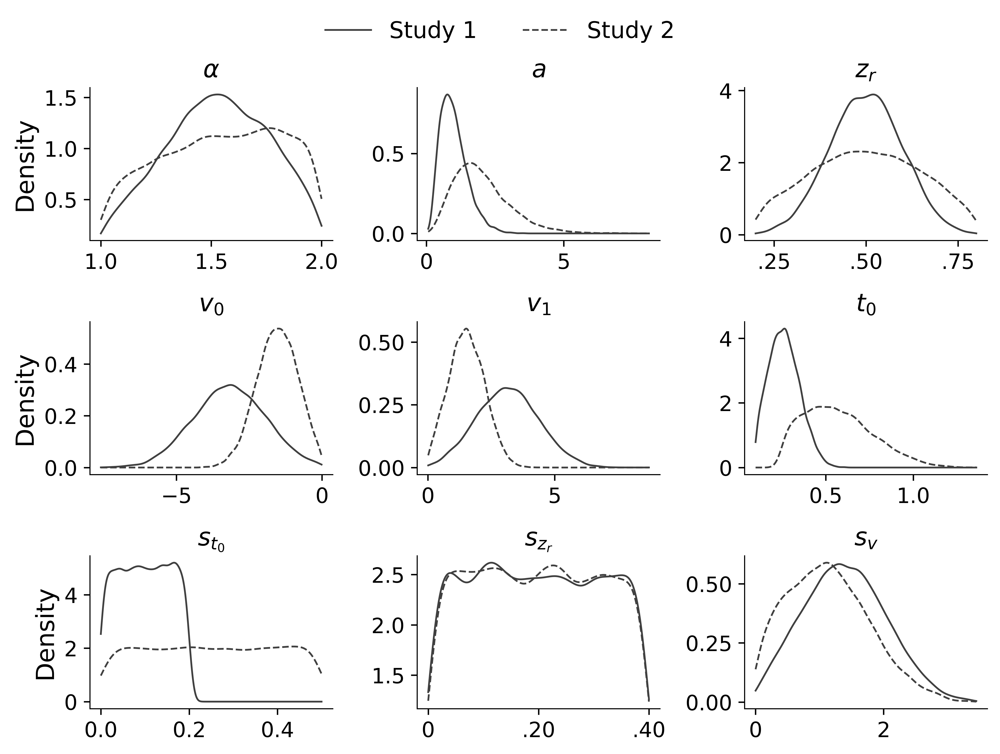

In [15]:
custom_plot_prior_overlay(full_levy_prior_samples_s1, full_levy_prior_samples_s2)

# Prior Push Forward Check

In [16]:
#SIMULATOR_CONTEXTS ="deadline"
if NUM_COMBINATIONS == 1:
    context_combinations = [(prior_context_generator(), simulator_context_generator())]
elif NUM_COMBINATIONS == 2:
    if len(PRIOR_CONTEXTS) == 1:
        context_combinations = [(prior_context_generator(), sim_context) for sim_context in range(len(SIMULATOR_CONTEXTS))]
    else:
        context_combinations = [(prior_context, simulator_context_generator()) for prior_context in range(len(PRIOR_CONTEXTS))]
else:  # NUM_COMBINATIONS == 4 or more complex cases
    context_combinations = list(itertools.product(range(len(PRIOR_CONTEXTS)), range(len(SIMULATOR_CONTEXTS))))

In [17]:
my_batch_size = 500  
all_rows = []

for prior_context, sim_context in context_combinations:
    check_prior = bf.simulation.Prior(
        batch_prior_fun=prior_simulator_functions.levy_prior,
        context_generator=bf.simulation.ContextGenerator(non_batchable_context_fun=lambda: prior_context),
        param_names=PARAM_NAMES
    )
    check_simulator = bf.simulation.Simulator(
        batch_simulator_fun=prior_simulator_functions.batch_simulator,
        context_generator=bf.simulation.ContextGenerator(non_batchable_context_fun=lambda: sim_context)
    )

    check_generative_model = bf.simulation.GenerativeModel(prior=check_prior, simulator=check_simulator)
    sim_rts = check_generative_model(batch_size=my_batch_size)['sim_data']  

    df = pd.DataFrame({
        'pp': np.repeat(np.arange(my_batch_size), sim_rts.shape[1]),
        'RT': sim_rts[:, :, 0].flatten(),
        'symbol': sim_rts[:, :, 1].astype(int).flatten(),
        'prior': prior_context,
        'simulator': sim_context
    })

    cond1 = (df['RT'] < 0) & (df['symbol'] == 1)
    cond2 = (df['RT'] > 0) & (df['symbol'] == 1)
    cond3 = (df['RT'] < 0) & (df['symbol'] == 0)
    cond4 = (df['RT'] > 0) & (df['symbol'] == 0)

    df['correct'] = np.nan
    df.loc[cond1, 'correct'] = 0
    df.loc[cond2, 'correct'] = 1
    df.loc[cond3, 'correct'] = 1
    df.loc[cond4, 'correct'] = 0
    df['correct'] = df['correct'].astype('Int64')

    df.loc[df['RT'] == 0, 'RT'] = np.nan
    df['RT'] = abs(df['RT'])

    for pp, group in df.groupby('pp'):
        RTs_correct = group.loc[group['correct'] == 1, 'RT']
        RTs_incorrect = group.loc[group['correct'] == 0, 'RT']
        
        mean_corr = RTs_correct.mean() if not RTs_correct.empty else np.nan
        mean_incorr = RTs_incorrect.mean() if not RTs_incorrect.empty else np.nan  
        mean_diff = mean_corr - mean_incorr if pd.notnull(mean_corr) and pd.notnull(mean_incorr) else np.nan

        skew_corr = skew(RTs_correct, bias=False) if RTs_correct.size > 2 else np.nan
        skew_incorr = skew(RTs_incorrect, bias=False) if RTs_incorrect.size > 2 else np.nan

        acc = group['correct'].mean()
        prop_timeout = group['RT'].isna().mean()
        
        all_rows.append({
            'prior': prior_context,
            'simulator': sim_context,
            'pp': pp,
            'meanRT_corr': mean_corr,
            'meanRT_incorr': mean_incorr,
            'meanRT_diff': mean_diff,
            'skew_corr': skew_corr,
            'skew_incorr': skew_incorr,
            'acc': acc,
            'prop_timeout': prop_timeout
        })

df_results = pd.DataFrame(all_rows)

df_results['is_sym_corr'] = df_results['skew_corr'].between(-1, 1)
df_results['is_sym_incorr'] = df_results['skew_incorr'].between(-1, 1)

INFO:root:Performing 2 pilot runs with the anonymous model...
INFO:root:Shape of parameter batch after 2 pilot simulations: (batch_size = 2, 9)
INFO:root:Shape of simulation batch after 2 pilot simulations: (batch_size = 2, 306, 2)
INFO:root:Could not determine shape of prior non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional prior batchable context provided.
INFO:root:Could not determine shape of simulation non-batchable context. Type appears to be non-array: <class 'int'>,                                    so make sure your input configurator takes cares of that!
INFO:root:No optional simulation batchable context provided.


In [18]:
my_vars = ['pp', 'prior', 'simulator', 'prop_timeout', 'is_sym_corr', 'acc']

df_rt = pd.melt(df_results, id_vars=my_vars, value_vars=['meanRT_corr', 'meanRT_incorr'], var_name='corr', value_name='rt')
df_rt['corr'] = df_rt['corr'].str.replace('meanRT_', '')

df_skew = pd.melt(df_results, id_vars=my_vars, value_vars=['skew_corr', 'skew_incorr'], var_name='corr', value_name='skew')
df_skew['corr'] = df_skew['corr'].str.replace('skew_', '')

df_long = pd.merge(df_rt, df_skew, on=my_vars + ['corr'])

In [19]:
min_corr = df_long[df_long['corr'] == 'corr']['rt'].min()
max_corr = df_long[df_long['corr'] == 'corr']['rt'].max()
min_incorr = df_long[df_long['corr'] == 'incorr']['rt'].min()
max_incorr = df_long[df_long['corr'] == 'incorr']['rt'].max()
min_rt = min(min_corr, min_incorr)
max_rt = max(max_corr, max_incorr)

min_corr = df_long[df_long['corr'] == 'corr']['skew'].min()
max_corr = df_long[df_long['corr'] == 'corr']['skew'].max()
min_incorr = df_long[df_long['corr'] == 'incorr']['skew'].min()
max_incorr = df_long[df_long['corr'] == 'incorr']['skew'].max()
min_skew = min(min_corr, min_incorr)
max_skew = max(max_corr, max_incorr)

min_acc = df_long[df_long['corr'] == 'corr']['acc'].min()
max_acc = df_long[df_long['corr'] == 'corr']['acc'].max()

In [20]:
df_results['meanRT_diff'].mean()

-0.14557828

Timeout Modeling:  Absent


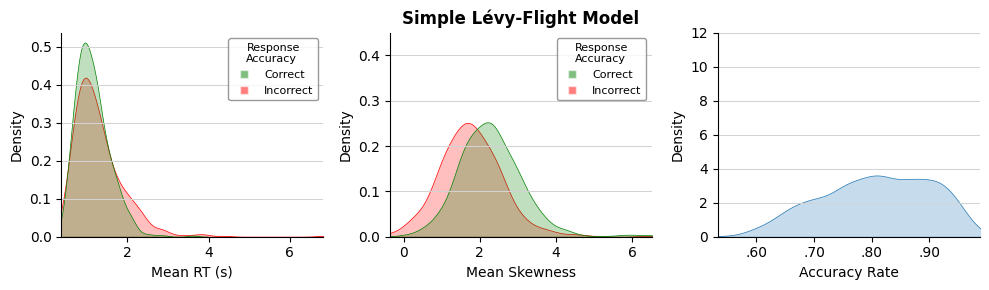

In [21]:
def apa_tick_formatter(digits=1):
    def formatter(x, _):
        if x == int(x):
            return str(int(x))
        else:
            return f'{x:.{digits}f}'.lstrip('0') 
    return formatter

prior_map = {0: "Simple Lévy-Flight Model", 1: "Simple Diffusion Model"}
simulator_map = {0: "Absent", 1: "Present"}
combinations = df_long[['prior', 'simulator']].drop_duplicates().sort_values(['prior', 'simulator']).values

n_rows = len(combinations)
fig, axs = plt.subplots(n_rows, 3, figsize=(10, 3 * n_rows), sharex=0)

if n_rows == 1:
    axs = [axs]

for i, (prior_val, sim_val) in enumerate(combinations):
    subset = df_long[(df_long['prior'] == prior_val) & (df_long['simulator'] == sim_val)]
    prior_label = prior_map[prior_val]
    simulator_label = simulator_map[sim_val]
    print("Timeout Modeling: ", simulator_label)

    # RT plot 
    sns.kdeplot(
        data=subset, x='rt', hue='corr', ax=axs[i][0],
        fill=True, lw=0.5, palette={'corr': 'green', 'incorr': 'red'}, legend=0
    )
    axs[i][0].grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    axs[i][0].spines['top'].set_visible(False)
    axs[i][0].spines['right'].set_visible(False)
    axs[i][0].set_xlim([min_rt, max_rt])
    axs[i][0].set_xlabel('Mean RT (s)')

    legend_items = [mlines.Line2D([0], [0], marker='s', color='w', label="Correct",
                                  markerfacecolor="green", 
                                  #markersize=my_marker_size, 
                                  alpha=0.5),
                    mlines.Line2D([0], [0], marker='s', color='w', label="Incorrect",
                                  markerfacecolor="red", 
                                  #markersize=my_marker_size, 
                                  alpha=0.5)]
    legend = axs[i][0].legend(handles=legend_items, title='Response\nAccuracy',
                     loc='upper right', frameon=True,
                     facecolor='white', edgecolor='gray', fontsize=8)
    legend.get_title().set_fontsize(8)

    # Skewness plot
    sns.kdeplot(
        data=subset, x='skew', hue='corr', ax=axs[i][1],
        fill=True, lw=0.5, palette={'corr': 'green', 'incorr': 'red'}, legend=False
    )
    axs[i][1].set_title(f'{prior_label}', fontweight="bold")
    axs[i][1].grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    axs[i][1].spines['top'].set_visible(False)
    axs[i][1].spines['right'].set_visible(False)
    axs[i][1].set_xlim([min_skew, max_skew])
    axs[i][1].set_ylim([0, .45])
    axs[i][1].set_xlabel('Mean Skewness')

    legend = axs[i][1].legend(handles=legend_items, title='Response\nAccuracy',
                     loc='upper right', frameon=True,
                     facecolor='white', edgecolor='gray', fontsize=8)
    legend.get_title().set_fontsize(8)

    # Accuracy plot
    sns.kdeplot(
        data=subset, x='acc', ax=axs[i][2], fill=True, lw=0.5, legend=False
    )
    axs[i][2].grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    axs[i][2].spines['top'].set_visible(False)
    axs[i][2].spines['right'].set_visible(False)
    axs[i][2].set_xlim([min_acc, max_acc])
    axs[i][2].set_ylim([0, 12])
    axs[i][2].set_xlabel('Accuracy Rate')
    axs[i][2].xaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))

plt.tight_layout()
plt.show()

# Configurator

Direct_conditions constitutes of a vector of 3 context elements for each data set: 
1. Number of observations
2. Computational model (0 = Levy, 1 = DDM)
3. Deadline condition (0 = no deadline, 1 = deadline)

In [22]:
def configurator(forward_dict):
    """Configure the output of the generative model for BayesFlow."""

    batch_size = forward_dict["sim_data"].shape[0]
    out_dict = {}

    # Summary conditions
    out_dict["summary_conditions"] = forward_dict["sim_data"]

    # Direct conditions: context dimensions num_obs, computational model (prior), and deadline condition (simulator)
    vec_ones = np.ones((batch_size, 1)).astype(np.float32)
    vec_num_obs = np.sqrt(forward_dict["sim_data"].shape[1]) * vec_ones
    vec_prior_context = forward_dict["prior_non_batchable_context"] * vec_ones
    vec_sim_context = forward_dict["sim_non_batchable_context"] * vec_ones
    out_dict["direct_conditions"] = np.concatenate([vec_num_obs, vec_prior_context, vec_sim_context], axis=1)

    # Parameters
    out_dict["parameters"] = forward_dict["prior_draws"].copy()
    # For DDM: Replace constant alpha parameters with random draws from a dummy standard normal
    if np.any(forward_dict["prior_non_batchable_context"]):  # 1 = DDM (works for both ints and vectors)
        out_dict["parameters"][:, -1] = np.random.normal(loc=0.0, scale=1.0, size=batch_size)

    return out_dict

In [23]:
print(sim_data["prior_draws"])
configurator(sim_data)

[[ 0.4179926   0.07305516  0.36171603 -2.6985664   0.37813336  2.5551205
   1.3444939   0.3662586   0.07000417]
 [ 0.87940943  0.28626785  0.373135   -0.8741075   1.5354484   1.247083
   1.7678769   0.01995276  1.2335433 ]]


{'summary_conditions': array([[[-0.8562565 ,  0.        ],
         [-0.74430144,  0.        ],
         [-0.6816605 ,  0.        ],
         ...,
         [-1.87207   ,  1.        ],
         [ 3.2433982 ,  1.        ],
         [ 2.370012  ,  1.        ]],
 
        [[ 0.94043434,  0.        ],
         [ 0.99529237,  0.        ],
         [-1.1209892 ,  0.        ],
         ...,
         [-1.1066769 ,  1.        ],
         [-1.1220714 ,  1.        ],
         [-1.1529286 ,  1.        ]]], dtype=float32),
 'direct_conditions': array([[18.493242,  0.      ,  0.      ],
        [18.493242,  0.      ,  0.      ]], dtype=float32),
 'parameters': array([[ 0.4179926 ,  0.07305516,  0.36171603, -2.6985664 ,  0.37813336,
          2.5551205 ,  1.3444939 ,  0.3662586 ,  0.07000417],
        [ 0.87940943,  0.28626785,  0.373135  , -0.8741075 ,  1.5354484 ,
          1.247083  ,  1.7678769 ,  0.01995276,  1.2335433 ]],
       dtype=float32)}

# Neural Network Training

## Pre Training

In [24]:
def f(x, presim_path):
    """
    Perform simulations for a given index and save results to a specified path.
    Simulation results are generated and directly written into the file within the loop. 
    
    Args:
        x (int): The current index or epoch number for which to generate and save simulation results.
        presim_path (str): The file path to the directory where simulation results should be stored.
    """
    # Construct the full path for the new pickle file using the presimulation path and index
    file_path = os.path.join(presim_path, f'presim_file_{x}.pkl')
    
    # Open the new file in write-binary mode
    with open(file_path, 'wb+') as file:
        # Generate and save simulation results for the specified number of iterations
        for k in range(NUM_ITERATIONS_PER_EPOCH):
            # Generate simulation results using the predefined generative model
            presim_res = generative_model(BATCH_SIZE)
            # Save the generated results into the pickle file
            pickle.dump(presim_res, file)

def f2(x, presim_path='sims'):
    """
    Perform simulations for a given index and save results to a specified path.
    All simulation results are first collected into a list file_list, and then the entire list is written to the file in one go outside of the loop.

    Args:
        x (int): The current index or epoch number for which to generate and save simulation results.
        presim_path (str, optional): The file path to the directory where simulation results should be stored. Defaults to 'sims'.
    """

    # Initialize a list to hold simulated data for each iteration
    file_list = [{} for _ in range(NUM_ITERATIONS_PER_EPOCH)]

    # Generate simulated data for each iteration
    for k in range(NUM_ITERATIONS_PER_EPOCH):
        file_list[k] = generative_model(BATCH_SIZE)  # Replace with actual simulation data

    # Construct the full path to the output file
    file_path = f'{presim_path}/presim_file_{x}.pkl'

    # Save the simulated data to a pickle file
    with open(file_path, 'wb+') as f:
        pickle.dump(file_list, f)

def multipickle_loader(file_path):
    """
    Load multiple pickle files from a single file and return their contents.
    
    This function reads a pickle file that potentially contains multiple
    pickled objects and returns them as a list.
    
    Args:
        file_path (str): The path to the pickle file from which to load objects.
    
    Returns:
        list: A list of objects that were stored in the pickle file.
    """
    # Initialize an empty list to store the simulation dictionaries
    sim_dicts = []
    # Open the specified pickle file in read-binary mode
    with open(file_path, 'rb') as f:
        try:
            # Continuously load objects from the file until an EOFError is raised
            while True:
                sim_dicts.append(pickle.load(f))
        except EOFError:
            # An EOFError indicates the end of the file has been reached
            pass
    
    # Return the list of simulation dictionaries
    return sim_dicts

In [25]:
def setup_network(
    checkpoint_path,
    input_dim=2,
    summary_net_settings=SUMMARY_NET_SETTINGS,
    param_names=PARAM_NAMES,
    num_coupling_layers=9,
    coupling_design="spline",
    generative_model=generative_model,
    configurator=configurator,
    learning_rate=0.0001 #0.00025
):
    """
    Set up a neural network for parameter estimation (works within a loop over ensemble members).
    
    Parameters:
    -----------
    checkpoint_path : str, optional
        Path to save checkpoints during training and load network from after training.
    input_dim : int, optional
        Dimensionality of the input data (default is 2).
    summary_net_settings : dict, optional
        Settings for the summary network (default is SUMMARY_NET_SETTINGS).
    param_names : list, optional
        List of parameter names (default is PARAM_NAMES).
    num_coupling_layers : int, optional
        Number of coupling layers in the invertible network (default is 7).
    coupling_design : str, optional
        Design choice for coupling layers (default is "spline").
    generative_model : tf.keras.Model, optional
        Generative model (default is generative_model).
    configurator : object, optional
        Configurator for training setup.
    learning_rate : float, optional
        Learning rate for Adam optimizer (default is 0.0001).

    Returns:
    -----------
    tuple
        Tuple containing amortizer (AmortizedPosterior), trainer (Trainer), and optimizer objects.
    """
    tf.keras.backend.clear_session()
    summary_net = bf.networks.DeepSet(
        summary_dim = summary_net_settings["summary_dim"],
        num_dense_s1 = summary_net_settings["num_dense_s1"],
        num_dense_s2 = summary_net_settings["num_dense_s2"],
        num_dense_s3 = summary_net_settings["num_dense_s3"],
        num_equiv = summary_net_settings["num_dense_equivariant"]
    )
    inference_net = bf.networks.InvertibleNetwork(
        num_params=len(param_names), 
        num_coupling_layers=num_coupling_layers, 
        coupling_design=coupling_design
    )
    amortizer = bf.amortizers.AmortizedPosterior(inference_net, summary_net)
    trainer = bf.trainers.Trainer(
        amortizer=amortizer, 
        generative_model=generative_model, 
        configurator=configurator,
        checkpoint_path=checkpoint_path,
        default_lr=learning_rate
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=
                                         tf.keras.optimizers.schedules.CosineDecay(
                                             learning_rate, NUM_ITERATIONS_PER_EPOCH*NUM_EPOCHS, alpha=0.0, name=None)
                                        )
    
    return amortizer, trainer, optimizer

In [26]:
# Presimulation (if applicable)
if __name__ == '__main__':
    if TRAINING_MODE == "presimulation":
        FULL_PRESIM_PATH = os.path.join(PRESIM_PATH, MY_NAME)
        if not os.path.exists(FULL_PRESIM_PATH): # Disables further presimulation if already existant 
            os.makedirs(FULL_PRESIM_PATH)
            
            if RUNNER == "pc1":
                with Pool(processes=NUM_PROCESSES) as pool:
                    presim_function = partial(f2, presim_path=FULL_PRESIM_PATH)
                    pool.map(presim_function, range(NUM_EPOCHS))
            else:
                with Pool(processes=NUM_PROCESSES) as pool:
                    presim_function = partial(f, presim_path=FULL_PRESIM_PATH)
                    pool.map(presim_function, range(NUM_EPOCHS))

## Training

2026-02-22 14:26:28.129837: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2026-02-22 14:26:28.129852: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:168] retrieving CUDA diagnostic information for host: UKFPHPSY-C0821
2026-02-22 14:26:28.129855: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:175] hostname: UKFPHPSY-C0821
2026-02-22 14:26:28.129880: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:199] libcuda reported version is: 575.57.8
2026-02-22 14:26:28.129889: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:203] kernel reported version is: NOT_FOUND: could not find kernel module information in driver version file contents: "NVRM version: NVIDIA UNIX Open Kernel Module for x86_64  575.57.08  Release Build  (dvs-builder@U22-I3-H04-01-5)  Sat May 24 07:03:13 UTC 2025
GCC version:  gcc version 13.3.0 (Ubuntu 

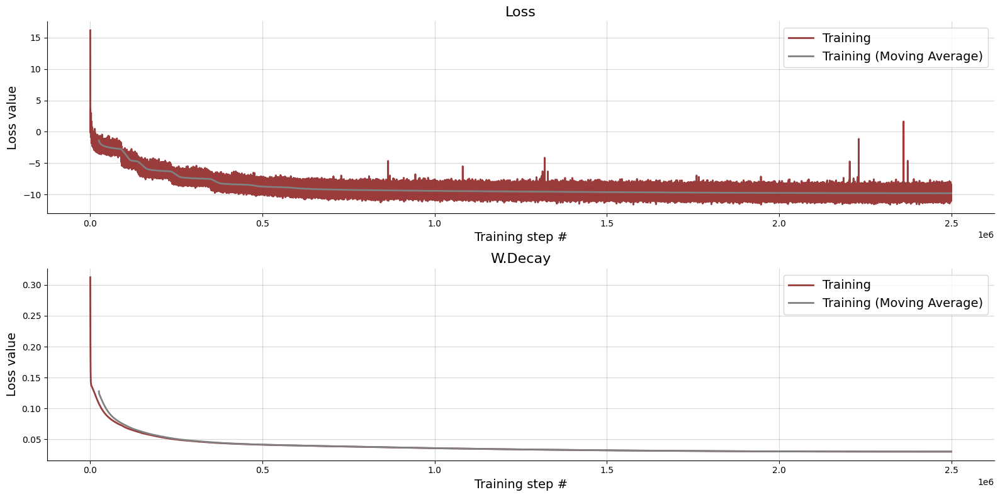

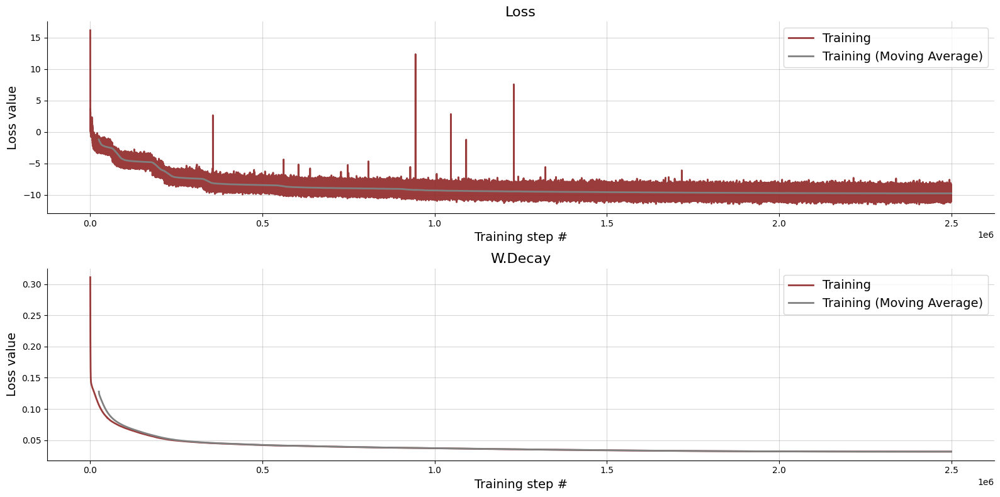

In [27]:
# Iterate over ensemble members (networks): training
for network in range(NUM_ENSEMBLE_MEMBERS):
    amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
    
    if not os.path.exists(f"checkpoint_{MY_NAME}/net{network + 1}"): # Disables further training when net was loaded from checkpoint
        if TRAINING_MODE == "presimulation":
            if RUNNER == "pc1":
                losses = trainer.train_from_presimulation(FULL_PRESIM_PATH, 
                                                          optimizer = optimizer, 
                                                          reuse_optimizer=True#, max_epochs=50
                                                         )
            else: 
                losses = trainer.train_from_presimulation(FULL_PRESIM_PATH, 
                                                          optimizer = optimizer, 
                                                          reuse_optimizer=True, 
                                                          custom_loader=multipickle_loader
                                                         )
        else:
            losses = trainer.train_online(epochs=NUM_EPOCHS, iterations_per_epoch=NUM_ITERATIONS_PER_EPOCH, batch_size=BATCH_SIZE)

    f = bf.diagnostics.plot_losses(trainer.loss_history.get_plottable(), moving_average=True)
    #f.savefig("figures/" + MY_NAME + "_net" +str(network + 1)+ "_losses.png")

## Post Training

### Inspect Losses

In [28]:
for network in range(NUM_ENSEMBLE_MEMBERS):
    amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
    my_history_net = trainer.loss_history.get_plottable()

    print("Network", network+1)
    print("shape:", my_history_net.shape)
    print(my_history_net.tail(10))

    first_nan_index = my_history_net['Loss'].isna().idxmax()
    last_valid_index_loss = my_history_net['Loss'].last_valid_index()
    last_valid_value_loss = my_history_net.at[last_valid_index_loss, 'Loss']
    print('Last valid value:', last_valid_value_loss)
    print('Last valid index:', last_valid_index_loss)

    following_rows = my_history_net.loc[last_valid_index_loss+1:]
    print('All following values are invalid' if following_rows.isna().all(axis=1).all() and first_nan_index!=0 else 'All values are valid')

INFO:root:Loaded loss history from checkpoint_ttj_s2_presimulation_250ep_10000it_levy_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_s2_presimulation_250ep_10000it_levy_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


Network 1
shape: (2500000, 2)
              Loss   W.Decay
2499990 -10.011015  0.030228
2499991  -9.364365  0.030228
2499992  -9.794655  0.030228
2499993  -9.515766  0.030228
2499994  -8.417092  0.030228
2499995 -10.227018  0.030228
2499996 -10.223998  0.030228
2499997  -9.853062  0.030228
2499998  -9.539467  0.030228
2499999  -9.986902  0.030228
Last valid value: -9.986902
Last valid index: 2499999
All values are valid


INFO:root:Loaded loss history from checkpoint_ttj_s2_presimulation_250ep_10000it_levy_no_deadline/net2/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_s2_presimulation_250ep_10000it_levy_no_deadline/net2/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


Network 2
shape: (2500000, 2)
              Loss   W.Decay
2499990  -9.982960  0.031597
2499991  -9.266801  0.031597
2499992  -9.909041  0.031597
2499993  -9.472720  0.031597
2499994  -8.441831  0.031597
2499995  -9.835371  0.031597
2499996 -10.163848  0.031597
2499997  -9.848717  0.031597
2499998  -9.291272  0.031597
2499999 -10.091808  0.031597
Last valid value: -10.091808
Last valid index: 2499999
All values are valid


# Validation

In [29]:
# File paths
VAL_ROOT_PATH = "validation_files"
os.makedirs(VAL_ROOT_PATH, exist_ok=True)
VAL_SIMS_FILE = VAL_ROOT_PATH + "/val_sims_list_" + MY_NAME + ".pkl"
PRIOR_SAMPLES_FILE = VAL_ROOT_PATH + "/prior_samples_" + MY_NAME + ".pkl"
POST_SAMPLES_FILE = VAL_ROOT_PATH + "/post_samples_" + MY_NAME + ".pkl"

def save_data(data, file_path):
    with open(file_path, "wb") as f:
        pickle.dump(data, f)

def load_data(file_path):
    with open(file_path, "rb") as f:
        return pickle.load(f)

# Check if files exist and load if possible, otherwise create
if all(os.path.exists(file) for file in [VAL_SIMS_FILE, PRIOR_SAMPLES_FILE, POST_SAMPLES_FILE]):
    print("Loading previously saved data...")
    val_sims_list = load_data(VAL_SIMS_FILE)
    prior_samples = load_data(PRIOR_SAMPLES_FILE)
    post_samples = load_data(POST_SAMPLES_FILE)
    print("Data loaded succesfully.")
else:
    print("Generating new data...")

    # Configuration and prior/simulator setup
    PRIOR_CONFIGS = {
        "levy": bf.simulation.Prior(batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=False), param_names=PARAM_NAMES),
        "ddm": bf.simulation.Prior(batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=True), param_names=PARAM_NAMES),
    }
    SIMULATOR_CONFIGS = {
        "no_deadline": bf.simulation.Simulator(batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=False)),
        "deadline": bf.simulation.Simulator(batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=True)),
    }

    # Initialize list to hold validation simulation results
    val_sims_list = []

    # Function to configure and append data
    def configure_and_append(prior_context, sim_context, num_sims=NUM_VAL_SIMS_PER_COMBINATION):
        prior = PRIOR_CONFIGS[prior_context]
        simulator = SIMULATOR_CONFIGS[sim_context]
        generative_model_combination = bf.simulation.GenerativeModel(prior=prior, simulator=simulator, skip_test=True)
        val_data_combination = generative_model_combination(batch_size=num_sims)
        val_data_combination['prior_non_batchable_context'] = 0 if prior_context == "levy" else 1
        val_data_combination['sim_non_batchable_context'] = 0 if sim_context == "no_deadline" else 1
        configured_val_data_combination = configurator(val_data_combination)
        val_sims_list.append(configured_val_data_combination)

    # Generate validation data for each combination of contexts
    for prior_context, sim_context in itertools.product(PRIOR_CONTEXTS, SIMULATOR_CONTEXTS):
        configure_and_append(prior_context, sim_context)

    # Extract prior samples and generate posterior samples for each combination
    prior_samples = [val_data_combination["parameters"] for val_data_combination in val_sims_list]

    post_samples = []
    for network in range(NUM_ENSEMBLE_MEMBERS):
        amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
        network_samples = [amortizer.sample(val_data_combination, n_samples=NUM_VAL_SAMPLES) for val_data_combination in val_sims_list]
        post_samples.append(network_samples)

    # Save data to files
    print("Saving data...")
    save_data(val_sims_list, VAL_SIMS_FILE)
    save_data(prior_samples, PRIOR_SAMPLES_FILE)
    save_data(post_samples, POST_SAMPLES_FILE)
    print("Data saved successfully.")

os.makedirs("figures", exist_ok=True)

Loading previously saved data...
Data loaded succesfully.


levy; no_deadline; network 1


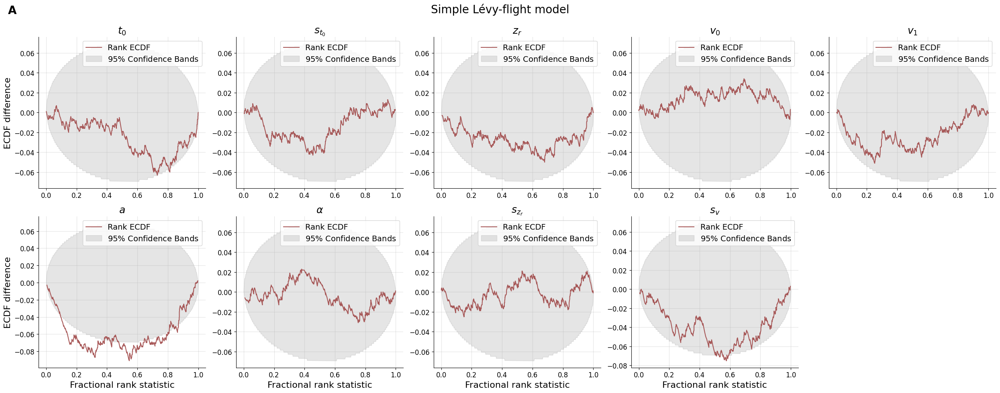

levy; no_deadline; network 2


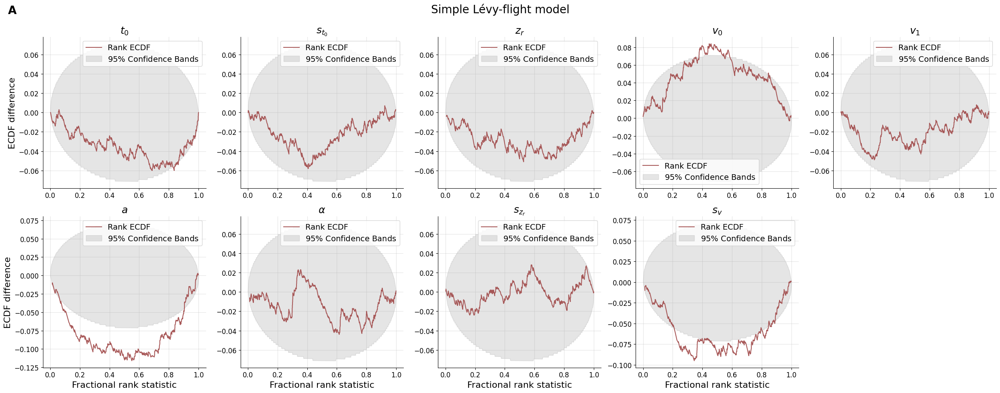

In [30]:
# SBC ECDFs
must_edit = 0
for c in range(NUM_COMBINATIONS):
    for network in range(NUM_ENSEMBLE_MEMBERS):
        comp_model = "ddm" if val_sims_list[c]["direct_conditions"][0, 1] else "levy"
        condition = "deadline" if val_sims_list[c]["direct_conditions"][0, 2] else "no_deadline"
        
        # Modify data and parameter labels if comp_model is "ddm" to hide dummy
        if comp_model == "ddm" and must_edit==0:
            post_samples_mod = post_samples[network][c][..., :-1]  
            prior_samples_mod = prior_samples[c][..., :-1]        
            param_names = PARAM_LABELS[:6]  
        else:
            post_samples_mod = post_samples[network][c]
            prior_samples_mod = prior_samples[c]
            param_names = PARAM_LABELS
            
        f = bf.diagnostics.plot_sbc_ecdf(
            post_samples_mod, prior_samples_mod,
            stacked=False, difference=True, param_names=param_names,
            n_row=2, n_col=4 
        )
        
        f.suptitle(f'Simple {model_map.get(comp_model)} model', fontsize=20, y=0.975)
        annotation = "A" if comp_model == "levy" else "B"
        f.text(0.01, 0.95, annotation, fontsize=20, ha='left', fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.98])

        if comp_model == "ddm" and must_edit:
            filename = f"figures/s2_ecdf_net{network+1}_{comp_model}_{condition}_edit.png"
        else:
            filename = f"figures/s2_ecdf_net{network+1}_{comp_model}_{condition}.png"
        #plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{comp_model}; {condition}; network {network + 1}')
        plt.show()

In [31]:
def filter_nan_post_samples(post_samples, prior_samples, num_combinations, num_ensemble_members):
    """
    Filters out NaN posterior samples (if present) so that plot_recovery does not crash; reports the number, fraction 
    and corresponding prior samples of NaN posterior samples.

    Parameters:
    -----------
    post_samples : nested list of numpy.ndarrays 
        Posterior samples to filter.
        Hierarchy/shape: (num_network)(num_combinations)(num_datasets, num_samples, num_parameters)
    num_combinations : int
        Number of condition combinations.
    num_ensemble_members : int
        Number of ensemble members.

    Returns:
    --------
    post_samples_filtered : numpy.ndarray
        Filtered posterior samples without NaN.
    """
    post_samples_filtered = copy.deepcopy(post_samples)

    for c in range(num_combinations):
        for network in range(num_ensemble_members):
            nan_mask = np.isnan(post_samples_filtered[network][c])
            
            if np.any(nan_mask):
                nan_fraction = nan_mask.sum() / post_samples_filtered[network][c].size
                num_parameters = post_samples_filtered[network][c].shape[-1]
                print(f"Number of NaN samples in network {network + 1}, condition {c + 1}: {nan_mask.sum() / num_parameters}")
                print(f"Fraction of NaNs in network {network + 1}, condition {c + 1}: {nan_fraction}")
                
                nan_dataset_indices = np.any(nan_mask, axis=1)
                nan_sample_indices = np.any(nan_mask, axis=(0, 2))
                print(f"NaN in posterior samples for following prior samples: {prior_samples[c][nan_dataset_indices]}")
                post_samples_filtered[network][c] = post_samples_filtered[network][c][:, ~nan_sample_indices, :]

    return post_samples_filtered

post_samples_filtered = filter_nan_post_samples(
    post_samples=post_samples,
    prior_samples=prior_samples,
    num_combinations=NUM_COMBINATIONS,
    num_ensemble_members=NUM_ENSEMBLE_MEMBERS
)

levy; no_deadline; network 1


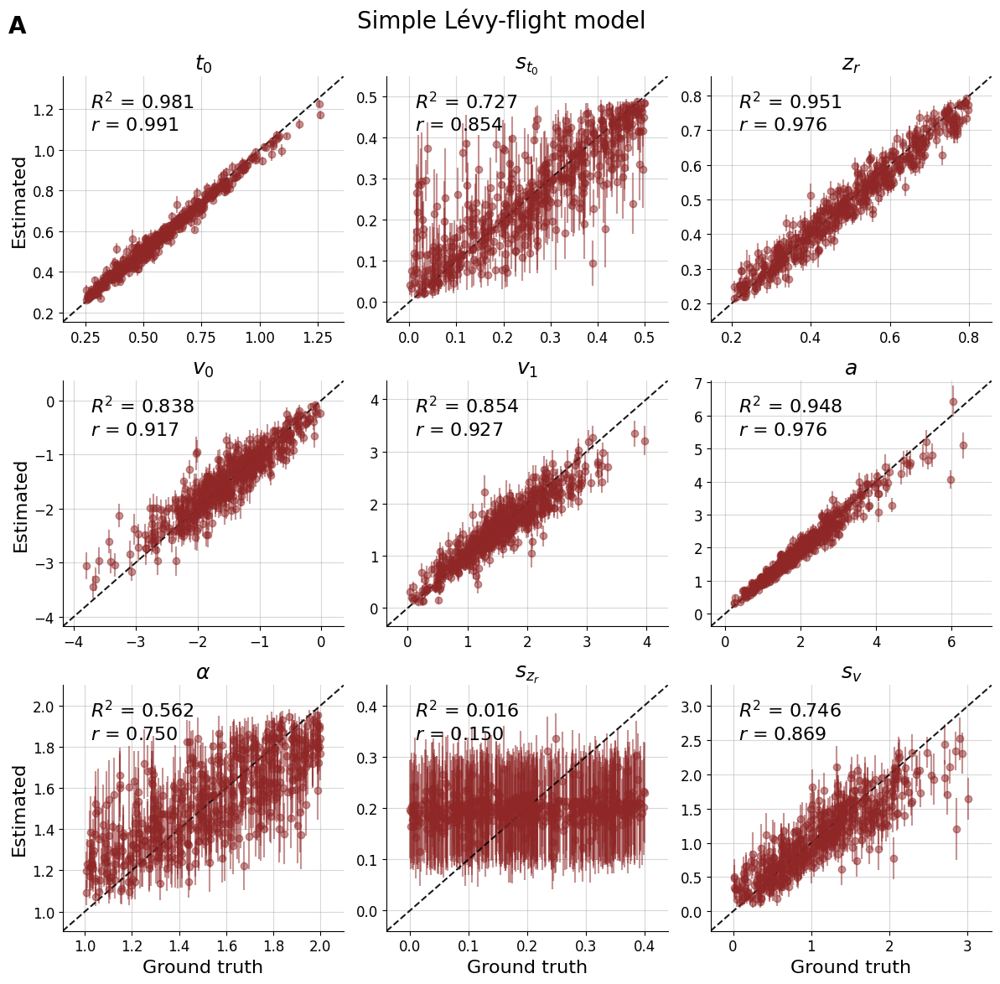

levy; no_deadline; network 2


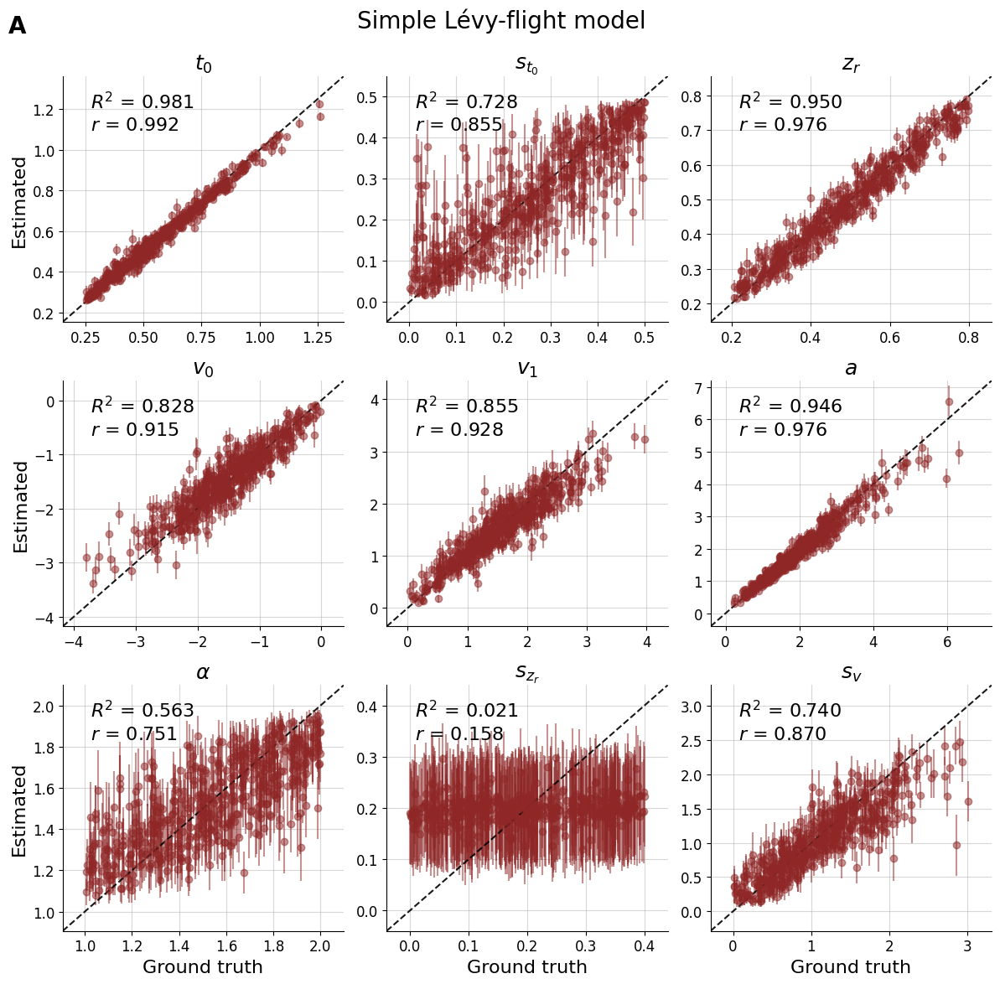

In [32]:
# Median posterior recovery
for c in range(NUM_COMBINATIONS):
    for network in range(NUM_ENSEMBLE_MEMBERS):
        comp_model = "ddm" if val_sims_list[c]["direct_conditions"][0, 1] else "levy"
        condition = "deadline" if val_sims_list[c]["direct_conditions"][0, 2] else "no_deadline"

        # Modify data and parameter labels if comp_model is "ddm"
        if comp_model == "ddm":
            post_samples_mod = post_samples_filtered[network][c]
            post_samples_mod = post_samples_mod[..., :-1]  
            prior_samples_mod = prior_samples[c][..., :-1]        
            param_names = PARAM_LABELS[:6] 
        else:
            post_samples_mod = post_samples[network][c]
            prior_samples_mod = prior_samples[c]
            param_names = PARAM_LABELS
        
        f = bf.diagnostics.plot_recovery(post_samples_mod, prior_samples_mod, param_names=param_names,
                                        n_row=3, n_col=3)
        
        f.suptitle(f'Simple {model_map.get(comp_model)} model', fontsize=20, y=0.975)
        annotation = "A" if comp_model == "levy" else "B"
        f.text(0.01, 0.95, annotation, fontsize=20, ha='left', fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.98])

        filename = f"figures/s2_param_recovery_net{network+1}_{comp_model}_{condition}.png"
        #plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{comp_model}; {condition}; network {network + 1}')
        plt.show()

levy; no deadline; network 1


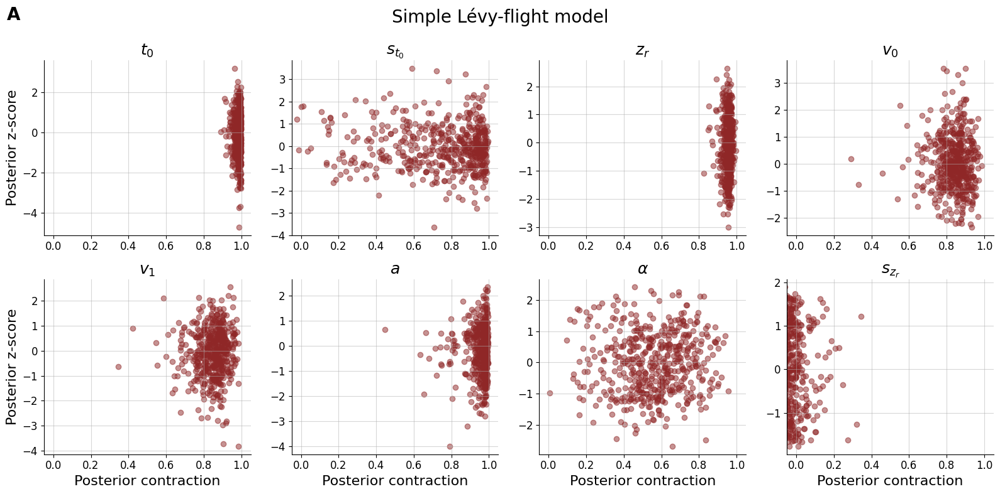

levy; no deadline; network 2


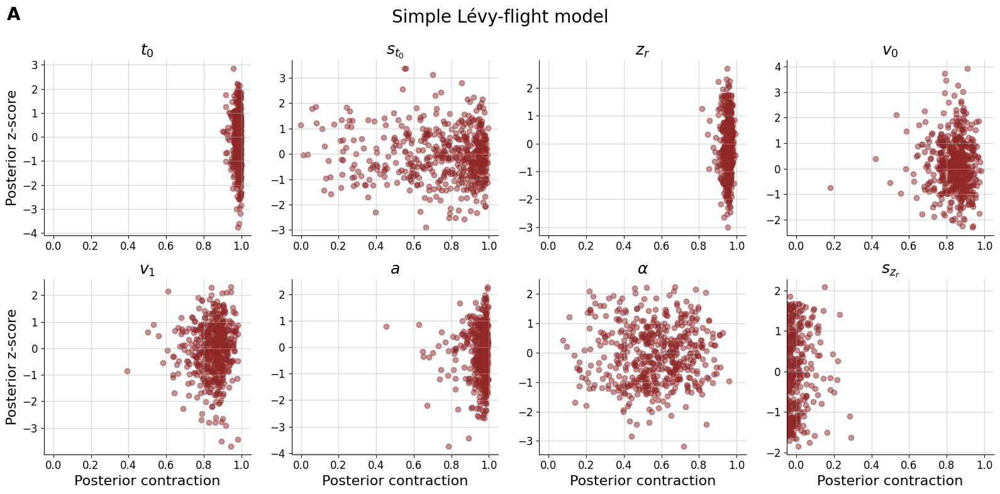

In [33]:
# Posterior contraction
for c in range(NUM_COMBINATIONS):
    for network in range(NUM_ENSEMBLE_MEMBERS):
        comp_model = "ddm" if val_sims_list[c]["direct_conditions"][0, 1] else "levy"
        condition = "deadline" if val_sims_list[c]["direct_conditions"][0, 2] else "no deadline"

        # Modify data and parameter labels if comp_model is "ddm"
        if comp_model == "ddm":
            post_samples_mod = post_samples[network][c][..., :-1] 
            prior_samples_mod = prior_samples[c][..., :-1]
            param_names = PARAM_LABELS[:6] 
        else:
            post_samples_mod = post_samples[network][c]
            prior_samples_mod = prior_samples[c]
            param_names = PARAM_LABELS
            
        f = bf.diagnostics.plot_z_score_contraction(post_samples_mod, prior_samples_mod, 
                                                    param_names=param_names,
                                                   n_row=2, n_col=4
                                                   )

        f.suptitle(f'Simple {model_map.get(comp_model)} model', fontsize=20, y=0.975)
        annotation = "A" if comp_model == "levy" else "B"
        f.text(0.01, 0.95, annotation, fontsize=20, ha='left', fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.98])

        filename = f"figures/s2_contraction_net{network+1}_{comp_model}_{condition}.png"
        #plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{comp_model}; {condition}; network {network + 1}')
        plt.show()

# Prediction on Empirical Data

**Overview of Instructions and Feedback given to Participants in the Test Phase**

| Condition         | Instruction                                                                                      | Feedback                                          | Trial                                            |
|-------------------|--------------------------------------------------------------------------------------------------|--------------------------------------------------|--------------------------------------------------|
| Control          | Please try to do well on the task: The point is to answer as quickly as possible while making as few mistakes as possible.                                                                | “Incorrect!” (icorrect) or none (correct)          | After response submission                        |                     |
| Explicit deadline | You will have very little time to make each decision. Please try to do well on the task despite the time pressure: The point is to make as few mistakes as possible.           | “Too slow!” (too slow) or none (in time)          | After response submission or 900 ms, whichever came first |


## Estimate Parameters

### Set Constants

In [34]:
# Select all contexts
SIMULATOR_CONTEXTS = ['no_deadline']

# Conditions
conditions = ['control', 'explicitDeadline']

# Get abbreviated name (i.e., for both contexts)
end_index = MY_NAME.find('it_') + len('it_')
MY_ABBR_NAME = MY_NAME[:end_index-1]
MY_ABBR_NAME

'ttj_s2_presimulation_250ep_10000it'

In [35]:
# Set paths
DATA_PATH = "individual_data_s2/"
ESTIM_ROOT_PATH = "estimates_param_estim/estimates_" + MY_ABBR_NAME
SIM_ROOT_PATH = "estimates_param_estim/simulates_" + MY_ABBR_NAME
ESTIM_ROOT_PATH

'estimates_param_estim/estimates_ttj_s2_presimulation_250ep_10000it'

In [36]:
# Ensure the estimates directory exists
os.makedirs(ESTIM_ROOT_PATH, exist_ok=True)

for network in range(NUM_ENSEMBLE_MEMBERS):
    for p in PRIOR_CONTEXTS:
        for s in SIMULATOR_CONTEXTS:
            estimates_path = f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_{p}_{s}.csv'
            
            if not os.path.exists(estimates_path):
                amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
                
                # Select data files based on simulator context
                if s == "no_deadline":
                    datafiles = glob.glob(DATA_PATH + '*.csv')
                elif s == "deadline":
                    datafiles = glob.glob(DATA_PATH+'*explicitDeadline.csv') 

                estimates = []
                for datafile in datafiles:  
                    # Load and preprocess data
                    raw_data = pd.read_csv(datafile)
                    
                    if ("explicitDeadline" in datafile) & (s == "no_deadline"):
                        raw_data = raw_data.loc[raw_data['RT'] != 0] #Delete timeouts

                    data = np.expand_dims(raw_data.to_numpy(), 0)
                    data = np.delete(data, 1, axis = 2) #Delete dark column
                    #Negative rts = dark/0, positive RTs = bright/1
                    
                    # Prepare direct conditions based on contexts
                    num_obs = int(np.sqrt(data.shape[1]))
                    prior_context = 0 if p == "levy" else 1
                    sim_context = 0 if s == "no_deadline" else 1
                    direct_conditions = np.array([num_obs, prior_context, sim_context])[np.newaxis, ...]
    
                    # Get posterior samples and calculate estimates
                    thisdict = {"summary_conditions": data, "direct_conditions": direct_conditions}
                    samples = amortizer.sample(thisdict, n_samples=5000, to_numpy=True)
                    theta_hat = samples.mean(axis=0)
                    estimates.append(theta_hat)
    
                # Save parameter estimates to CSV
                df = pd.DataFrame(np.array(estimates), columns=PARAM_NAMES)
                df['file'] = [os.path.basename(filepath) for filepath in datafiles]  
                df[['pp', 'condition']] = df['file'].str.extract(r'file(\d+)_(control|explicitDeadline)\.csv')
                df.to_csv(estimates_path, index=False)
                print(f"Saved estimates to {estimates_path}")
            else:
                print(f"{estimates_path} already exists")

estimates_param_estim/estimates_ttj_s2_presimulation_250ep_10000it/estimates_net1_levy_no_deadline.csv already exists
estimates_param_estim/estimates_ttj_s2_presimulation_250ep_10000it/estimates_net2_levy_no_deadline.csv already exists


### Example

In [37]:
#Example sample 
p = "levy"
s = "no_deadline"
network = 0
amortizer, trainer, optimizer = setup_network(checkpoint_path=f"checkpoint_{MY_NAME}/net{network + 1}")
datafiles = glob.glob(DATA_PATH + '*.csv')
datafile = datafiles[42]
raw_data = pd.read_csv(datafile)
data = np.expand_dims(raw_data.to_numpy(), 0)
data = np.delete(data, 1, axis = 2)
num_obs = int(np.sqrt(data.shape[1]))
prior_context = 0 if p == "levy" else 1
sim_context = 0 if s == "no_deadline" else 1
direct_conditions = np.array([num_obs, prior_context, sim_context])[np.newaxis, ...]
thisdict = {"summary_conditions": data, "direct_conditions": direct_conditions}
samples = amortizer.sample(thisdict, n_samples=5000, to_numpy=True)

INFO:root:Loaded loss history from checkpoint_ttj_s2_presimulation_250ep_10000it_levy_no_deadline/net1/history_250.pkl.
INFO:root:Networks loaded from checkpoint_ttj_s2_presimulation_250ep_10000it_levy_no_deadline/net1/ckpt-250
INFO:root:Performing a consistency check with provided components...
INFO:root:Done.


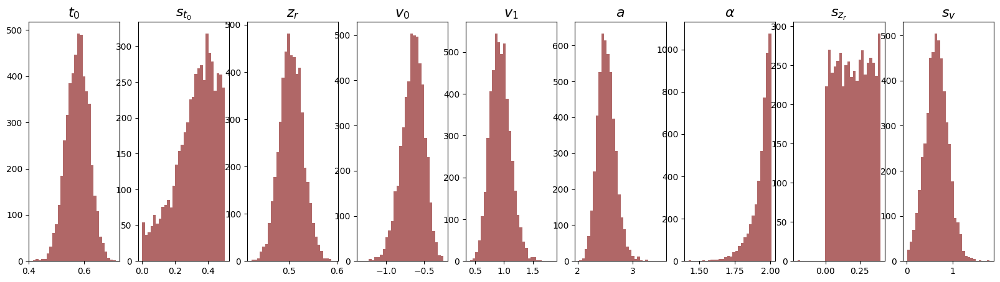

In [38]:
fig, axes = plt.subplots(nrows=1, ncols=len(PARAM_LABELS), figsize=(20, 5))

# Plotting histograms for each feature
for i in range(len(PARAM_NAMES)):
    axes[i].hist(samples[:, i], bins=30, color="#8f2727", alpha=0.7)
    axes[i].set_title(PARAM_LABELS[i], fontsize=16)

## Inspect Parameter Point Estimates

### By Table 

In [39]:
df_all = pd.DataFrame()  

for network in range(NUM_ENSEMBLE_MEMBERS):
    for p in PRIOR_CONTEXTS:
        for s in SIMULATOR_CONTEXTS:
            estimates_path = f'{ESTIM_ROOT_PATH}/estimates_net{network+1}_{p}_{s}.csv'
            print(estimates_path)
            df = pd.read_csv(estimates_path)
            df['net'] = network+1
            df['model'] = p
            df['sim'] = s
            df_all = pd.concat([df_all, df], ignore_index=True) 

df_all['condition'] = pd.Categorical(df_all['condition'], 
                                     categories=["explicitDeadline", "control"], ordered=True)
df_all['net'] = pd.Categorical(df_all['net'], ordered=True)
df_all.loc[df_all['model'] == 'ddm', 'alpha'] = np.nan
df_all

estimates_param_estim/estimates_ttj_s2_presimulation_250ep_10000it/estimates_net1_levy_no_deadline.csv
estimates_param_estim/estimates_ttj_s2_presimulation_250ep_10000it/estimates_net2_levy_no_deadline.csv


,t0,st0,zr,v0,v1,a,alpha,szr,sv,file,pp,condition,net,model,sim
0,0.494326,0.231787,0.611175,-0.446271,2.192114,0.536785,1.648326,0.213057,0.660136,file26_explicitDeadline.csv,26,explicitDeadline,1,levy,no_deadline
1,0.525908,0.340663,0.440948,-1.351066,1.981008,0.458460,1.706080,0.200362,1.288669,file48_explicitDeadline.csv,48,explicitDeadline,1,levy,no_deadline
2,0.540969,0.287098,0.555252,-1.304175,1.981434,1.137546,1.827493,0.198754,1.181860,file382_control.csv,382,control,1,levy,no_deadline
3,0.543541,0.297321,0.416836,-0.910782,1.603912,1.244342,1.796209,0.208682,0.764551,file191_control.csv,191,control,1,levy,no_deadline
4,0.640833,0.428601,0.540860,-0.904775,1.142375,1.871501,1.884213,0.205688,0.383498,file222_control.csv,222,control,1,levy,no_deadline
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,0.437993,0.276553,0.511494,-0.591475,1.533737,0.535873,1.713607,0.203935,0.956589,file81_explicitDeadline.csv,81,explicitDeadline,2,levy,no_deadline
316,0.555375,0.359293,0.523375,-1.400910,1.757783,0.820371,1.748569,0.196672,1.518146,file53_control.csv,53,control,2,levy,no_deadline
317,0.340381,0.230738,0.440917,-0.175317,1.323140,2.737763,1.618393,0.224690,0.998701,file356_control.csv,356,control,2,levy,no_deadline
318,0.449498,0.164863,0.466758,-0.881165,2.158707,2.092071,1.940349,0.185396,1.071948,file47_control.csv,47,control,2,levy,no_deadline


In [40]:
for network in range(NUM_ENSEMBLE_MEMBERS):
    print("\nNetwork", network+1)
    df_net = df_all.loc[df_all['net'] == network+1]
    summary_table = (
        df_net.groupby(['condition'], observed=False)[['alpha', 'a', 'zr', 'v0', 'v1', 't0']]
        .agg(['mean', 'std'])
        .round(3)
        .reset_index()
    )
    display(summary_table)

    summary_table = (
        df_net.groupby(['condition'], observed=False)[['alpha', 'a', 'zr', 'v0', 'v1', 't0']]
        .agg(['min', 'max'])
        .round(2)
        .reset_index()
    )
    display(summary_table)


Network 1


condition  alpha             a            zr            v0         \
                      mean    std   mean    std   mean    std   mean    std   
0  explicitDeadline  1.721  0.061  0.520  0.047  0.498  0.112 -1.242  0.574   
1           control  1.803  0.091  1.361  0.546  0.480  0.063 -1.165  0.452   

      v1            t0         
    mean    std   mean    std  
0  1.910  0.499  0.493  0.043  
1  1.843  0.434  0.510  0.074

condition alpha           a          zr          v0          v1  \
                      min   max   min   max   min   max   min   max   min   
0  explicitDeadline  1.54  1.81  0.39  0.63  0.28  0.72 -2.70 -0.24  0.71   
1           control  1.49  1.94  0.55  3.25  0.32  0.62 -2.25 -0.16  0.53   

           t0        
    max   min   max  
0  2.85  0.37  0.58  
1  2.81  0.35  0.70


Network 2


condition  alpha             a            zr            v0         \
                      mean    std   mean    std   mean    std   mean    std   
0  explicitDeadline  1.722  0.052  0.531  0.046  0.498  0.109 -1.185  0.577   
1           control  1.805  0.097  1.361  0.544  0.481  0.063 -1.125  0.453   

      v1            t0         
    mean    std   mean    std  
0  1.884  0.505  0.487  0.041  
1  1.826  0.439  0.504  0.070

condition alpha           a          zr          v0          v1  \
                      min   max   min   max   min   max   min   max   min   
0  explicitDeadline  1.61  1.82  0.41  0.67  0.29  0.71 -2.56 -0.25  0.71   
1           control  1.38  1.94  0.55  3.20  0.32  0.63 -2.31 -0.16  0.54   

           t0        
    max   min   max  
0  2.84  0.36  0.57  
1  2.90  0.34  0.66

In [41]:
for network in range(NUM_ENSEMBLE_MEMBERS):
    print("\nNetwork", network+1)
    df_net = df_all.loc[df_all['net'] == network+1]
    summary_table = (
        df_net.groupby(['condition'], observed=False)[['st0', 'sv', 'szr']]
        .agg(['mean', 'std'])
        .round(3)
        .reset_index()
    )
    display(summary_table)

    summary_table = (
        df_net.groupby(['condition'], observed=False)[['st0', 'sv', 'szr']]
        .agg(['min', 'max'])
        .round(2)
        .reset_index()
    )
    display(summary_table)


Network 1


condition    st0            sv           szr       
                      mean    std   mean    std   mean    std
0  explicitDeadline  0.273  0.043  1.066  0.231  0.204  0.007
1           control  0.263  0.082  1.135  0.307  0.200  0.008

condition   st0          sv         szr      
                      min   max   min   max   min   max
0  explicitDeadline  0.18  0.36  0.64  1.59  0.18  0.22
1           control  0.10  0.48  0.38  2.37  0.18  0.24


Network 2


condition    st0            sv           szr       
                      mean    std   mean    std   mean    std
0  explicitDeadline  0.265  0.041  0.975  0.255  0.204  0.006
1           control  0.252  0.080  1.078  0.301  0.200  0.009

condition   st0          sv         szr      
                      min   max   min   max   min   max
0  explicitDeadline  0.18  0.34  0.51  1.69  0.19  0.22
1           control  0.10  0.48  0.42  2.21  0.18  0.23

### Out of bounds?

In [42]:
prior_bounds = {
    'zr': (0.2, 0.8),
    'a': (0, 10),
    'v0': (-18.51, -0.01),
    'v1': (0.01, 18.51),
    't0': (0.25, 1.5),
    'st0': (0.0, 0.5),
    'sv': (0.0, 3.45),
    'alpha': (1.0, 2.0),
    'szr': (0.0, 0.4),
    'sv': (0.0, 3.45)
}
violations = []

for i, row in df_all.iterrows():
    network = row['net']
    model = row['model']
    condition = row['condition']
    simulator = row['sim']
    participant = row['pp']

    for param in PARAM_NAMES:
        if model == 'ddm' and param == 'alpha':
            continue  # skip dummy alpha param in ddm
        
        val = row[param]
        low, high = prior_bounds[param]

        if not (low <= val <= high):
            violations.append({
                'participant': participant,
                'network': network,
                'model': model,
                'sim': simulator,
                'condition': condition,
                'parameter': param,
                'value': val,
                'lower_bound': low,
                'upper_bound': high
            })
            
df_violations = pd.DataFrame(violations)
df_violations

""


In [43]:
if not df_violations.empty:
    df_violations_alpha_net1 = df_violations.loc[(df_violations['sim'] == 'no_deadline') & (df_violations['network'] == 1)]
    print(len(df_violations_alpha_net1))
    print(df_violations_alpha_net1['value'].min())
    print(df_violations_alpha_net1['value'].max())
    df_violations_alpha_net1['participant'].tolist()

### By Visualization

In [44]:
def apa_tick_formatter(digits=1):
    def formatter(x, _):
        if x == int(x):
            return str(int(x))
        else:
            return f'{x:.{digits}f}'.lstrip('0') 
    return formatter
    
def blend_with_white(color, alpha=0.5):
    original_color = mcolors.to_rgb(color)
    white = (1, 1, 1) 
    blended_color = [alpha * oc + (1 - alpha) * w for oc, w in zip(original_color, white)]
    return mcolors.to_hex(blended_color)

base_palette  = {"control": "#6B6B6B", "explicitDeadline": "teal"} 
alpha_value = 0.6 
palette = {key: blend_with_white(color, alpha=alpha_value) for key, color in base_palette.items()}

num_params = len(PARAM_NAMES)
condition_order = ["control", "explicitDeadline"]
condition_labels = ["Control", "Explicit\nDeadline"]

simulator_title = "Timeout Modeling"
simulator_labels = ["Absent"]
model_map_title_case = {'levy': 'Lévy-Flight'} 

In [45]:
re_PARAM_NAMES = ["alpha", "a", "zr", "v0_r", "v1", "t0", "st0", 'szr', 'sv']
fancy_PARAM_LABELS = [r"Stability Parameter ($\alpha$)",
                      r"Threshold Separation ($a$)",
                      r"Relative Starting Point ($z_r$)", 
                       r"Drift Rate for Dark ($v_{0}$)", 
                      r"Drift Rate for Bright ($v_{1}$)", 
                      r"Nondecision Time ($t_0$)", 
                      r"Intertrial Variability of $t_0$ ($s_{t_0}$)",
                      r"Intertrial Variability of $z_r$ ($s_{z_r}$)",
                      r"Intertrial Variability of $v$ ($s_{v}$)",
                     ]

Network 1


/tmp/ipykernel_3090456/2908979539.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(condition_labels)
/tmp/ipykernel_3090456/2908979539.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(condition_labels)
/tmp/ipykernel_3090456/2908979539.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(condition_labels)


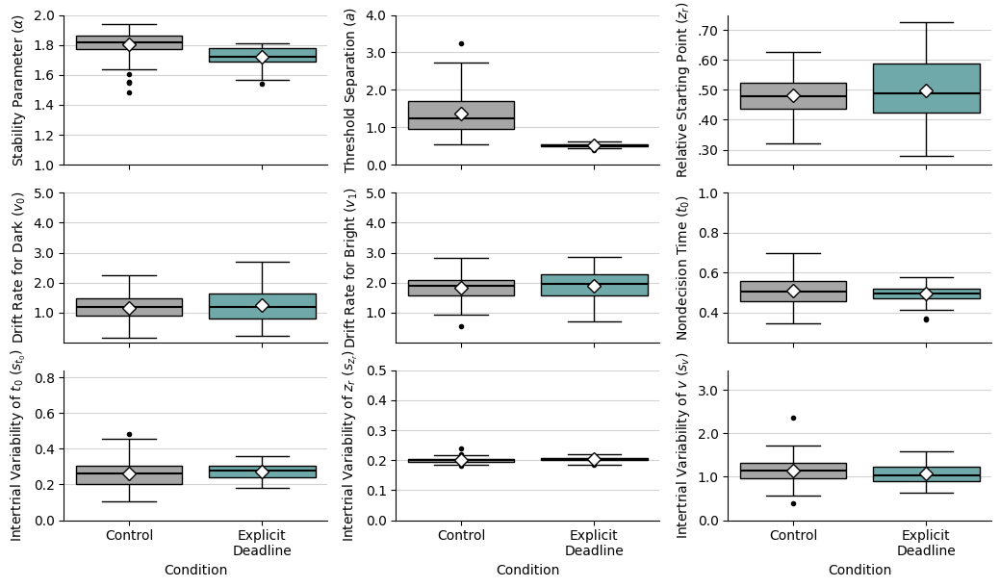

Network 2


/tmp/ipykernel_3090456/2908979539.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(condition_labels)
/tmp/ipykernel_3090456/2908979539.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(condition_labels)
/tmp/ipykernel_3090456/2908979539.py:44: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(condition_labels)


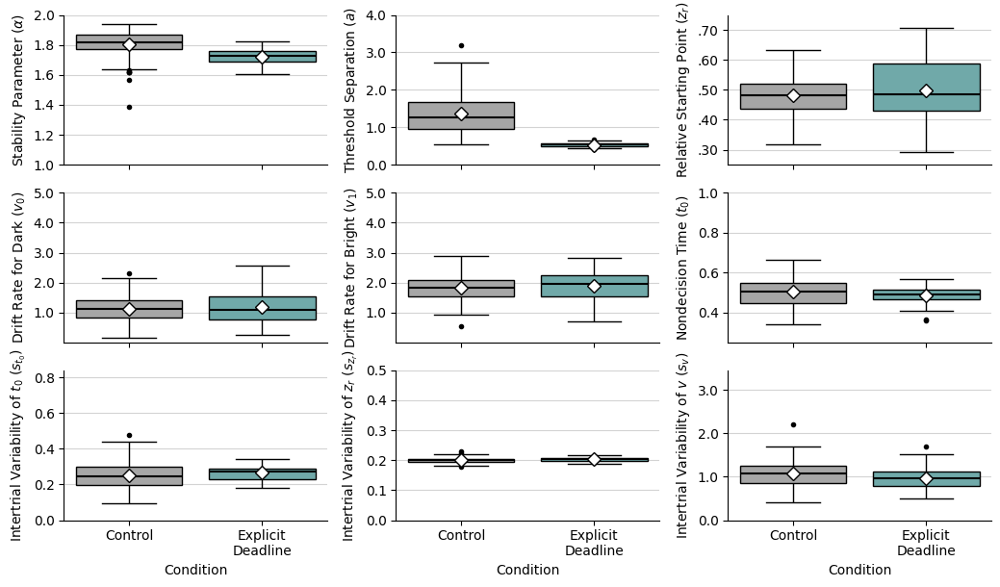

In [46]:
y0_y1_map = {
    'zr': [0.25, 0.75],
    'a': [0, 4],
    'v0_r': [0.01, 5],
    'v1': [0.01, 5],
    't0': [0.25, 1],
    'st0': [0.0, 0.84],
    'sv': [0.0, 3.45],
    'alpha': [1.0, 2.0],
    'szr': [0.0, 0.5],
    'sv': [0.0, 3.45]
}

nrows, ncols = 3, 3  

for network in range(NUM_ENSEMBLE_MEMBERS):
    print("Network", network + 1)

    df_levy = pd.read_csv(f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_levy_no_deadline.csv')
    df_levy["v0_r"] = df_levy["v0"] * -1
    fig, axes = plt.subplots(nrows, ncols, figsize=(10.5, 6.2))
    axes_flat = axes.flatten()

    for i, param in enumerate(re_PARAM_NAMES):
        ax = axes_flat[i]
        sns.boxplot(
            x="condition", y=param, hue="condition", data=df_levy,
            order=condition_order, palette=palette, legend=False, ax=ax,
            flierprops=dict(marker='o', markerfacecolor='black', markeredgecolor="black", markersize=3),
            whiskerprops=dict(color="black"),
            boxprops=dict(edgecolor="black"),
            capprops=dict(color="black"),
            medianprops=dict(color="black", linewidth=1.5)
        )

        if param == "zr":
            ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))
        else:
            ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.1f}"))

        is_bottom_row = (i // ncols) == (nrows - 1)
        if is_bottom_row:
            ax.set_xlabel("Condition")
            ax.set_xticklabels(condition_labels)
        else:
            ax.set_xlabel("")
            ax.set_xticklabels([])

        ax.set_ylabel(f"{fancy_PARAM_LABELS[i]}")
        ax.set_ylim(y0_y1_map[param])

        means = df_levy.groupby("condition")[param].mean()
        for k, cond in enumerate(condition_order):
            if cond in means.index:
                ax.plot(
                    k, means.loc[cond], "D",
                    markerfacecolor="white", markersize=7, markeredgecolor="black",
                    zorder=3
                )

        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(True, which="major", axis="y", color="lightgrey")

    for j in range(len(re_PARAM_NAMES), nrows * ncols):
        axes_flat[j].axis("off")

    plt.tight_layout()
    plt.show()

# Visualization Priors vs. Posteriors

In [47]:
def my_2d_f(p, s, network, file, n_samples = 1000):
    raw_data = pd.read_csv(file)
    data = np.expand_dims(raw_data.to_numpy(), 0)
    data = np.delete(data, 1, axis=2)
    if ("explicitDeadline" in datafile) & (s == "no_deadline"):
        raw_data = raw_data.loc[raw_data['RT'] != 0] #Delete timeouts
    num_obs = int(np.sqrt(data.shape[1]))
    prior_context = 0 if p == "levy" else 1
    sim_context = 0 if s == "no_deadline" else 1
    direct_conditions = np.array([num_obs, prior_context, sim_context])[np.newaxis, ...]

    thisdict = {"summary_conditions": data, "direct_conditions": direct_conditions}
    samples = amortizer.sample(thisdict, n_samples=n_samples, to_numpy=True)

    PRIOR_CONFIGS = {
        "levy": bf.simulation.Prior(
            batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=False),
            param_names=PARAM_NAMES
        ),
        "ddm": bf.simulation.Prior(
            batch_prior_fun=partial(prior_simulator_functions.levy_prior, fix_alpha=True),
            param_names=PARAM_NAMES
        ),
    }
    SIMULATOR_CONFIGS = {
        "no_deadline": bf.simulation.Simulator(
            batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=False)
        ),
        "deadline": bf.simulation.Simulator(
            batch_simulator_fun=partial(prior_simulator_functions.batch_simulator, deadline=True)
        ),
    }

    prior = PRIOR_CONFIGS[p]
    simulator = SIMULATOR_CONFIGS[s]
    generative_model_2d = bf.simulation.GenerativeModel(
        prior=prior, simulator=simulator, skip_test=True
    )

    print("Example for:", p, s, "network", network + 1)
    f = bf.diagnostics.plot_posterior_2d(samples, generative_model_2d.prior)

Example for: levy no_deadline network 1


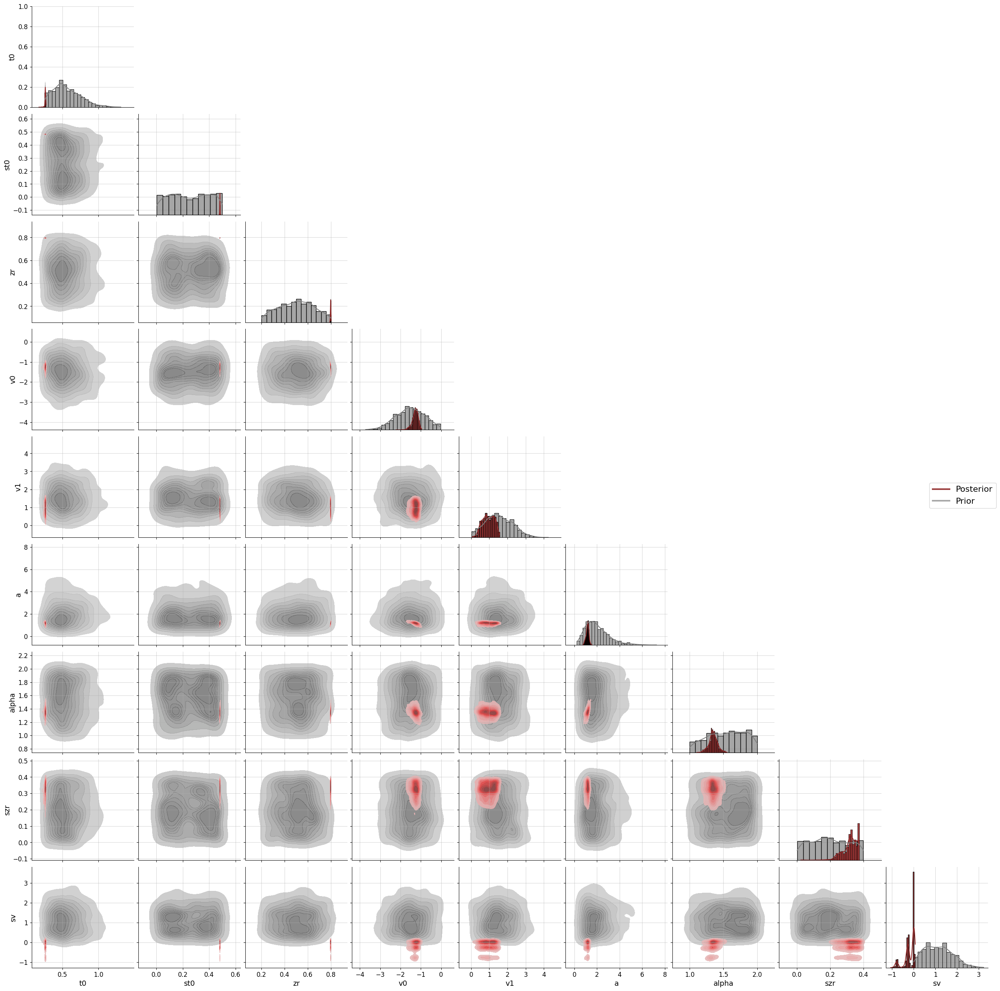

In [48]:
#Example sample 
my_2d_f(p="levy", s="no_deadline", network=0, file=datafiles[0])

Example for: levy no_deadline network 1


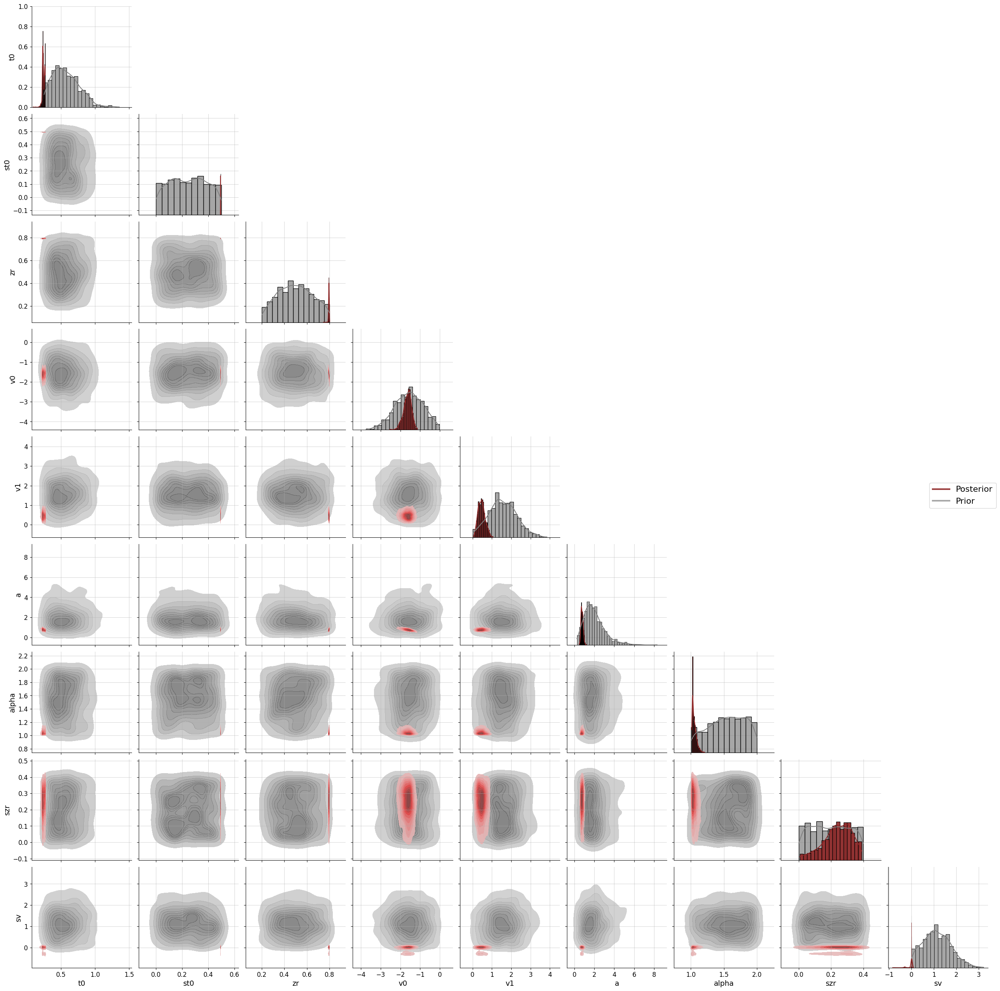

In [49]:
#Example sample 
my_2d_f(p="levy", s="no_deadline", network=0, file=datafiles[1])

Example for: levy no_deadline network 1


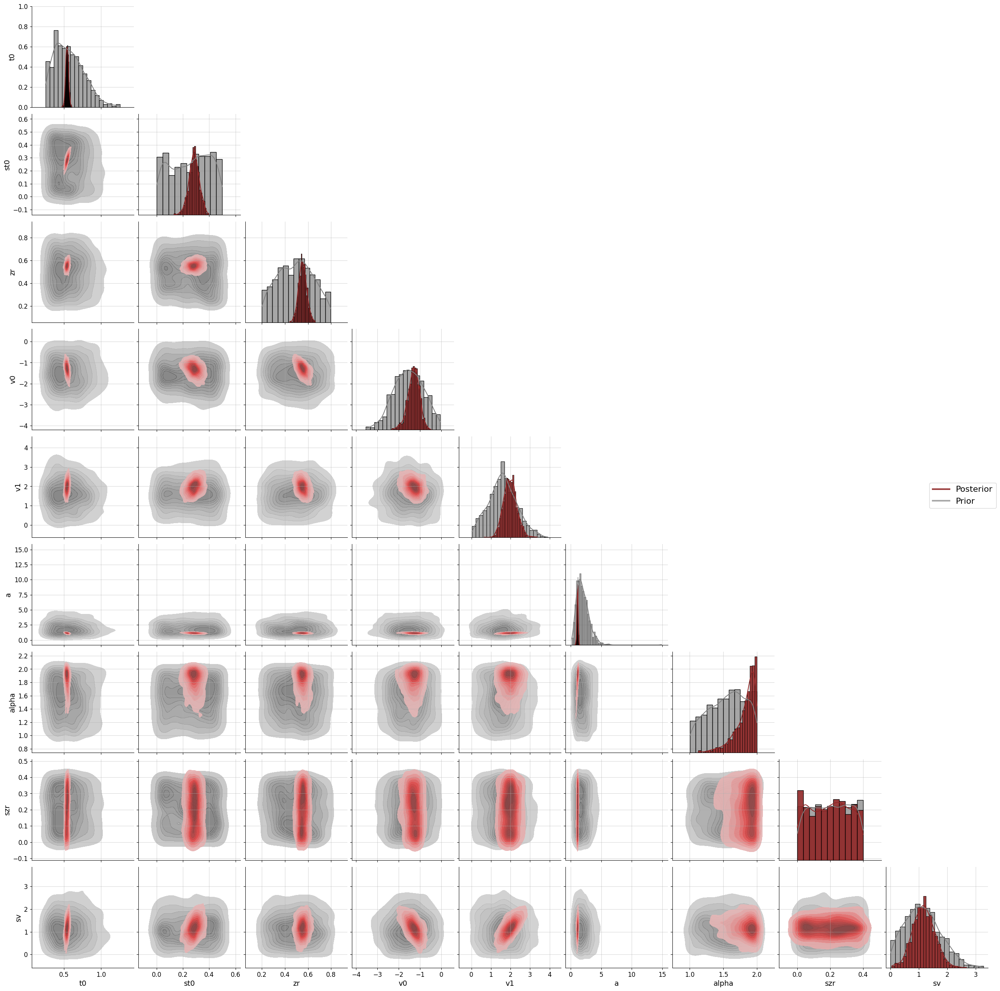

In [50]:
#Example sample 
my_2d_f(p="levy", s="no_deadline", network=0, file=datafiles[2])

Example for: levy no_deadline network 1


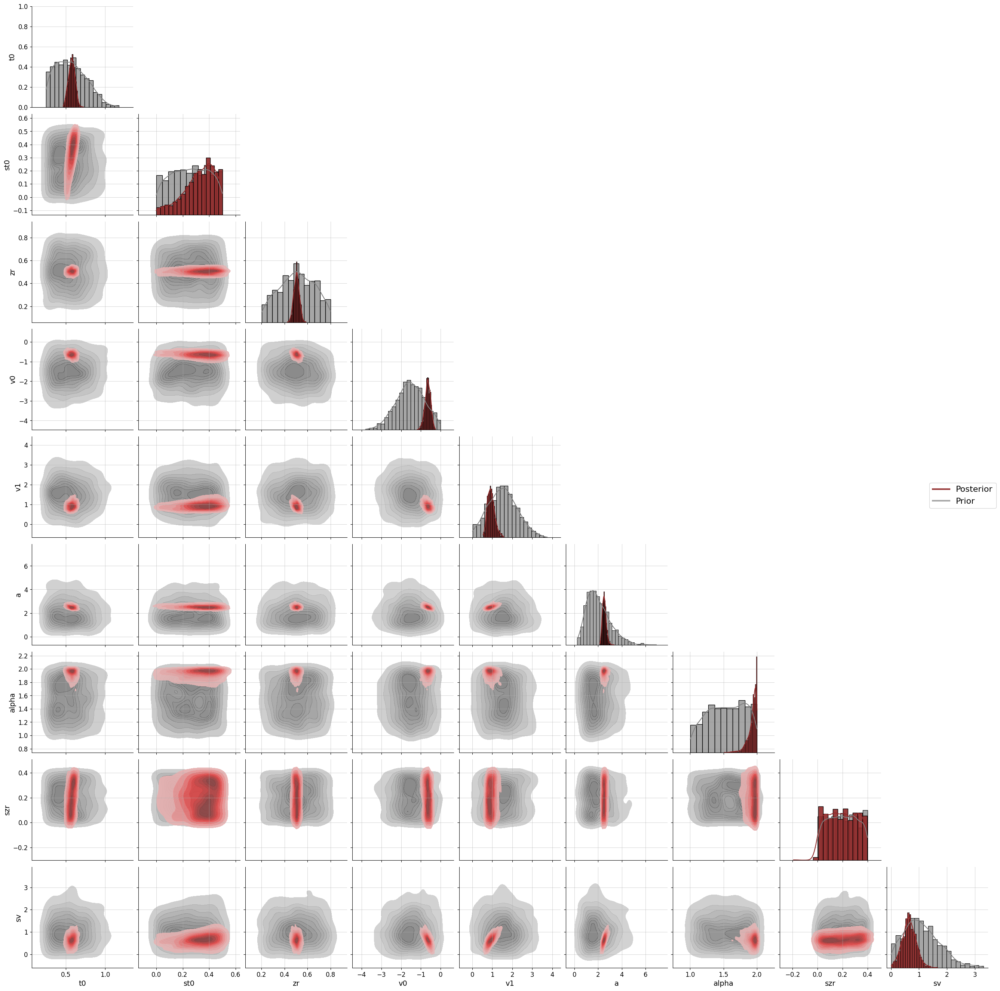

In [51]:
#Example sample 
my_2d_f(p="levy", s="no_deadline", network=0, file=datafiles[42])

# Ensemble Agreement

In [52]:
def plot_ensemble_agreement(
    net1_estimates,
    net2_estimates,
    param_names=None,
    fig_size=None,
    label_fontsize=16,
    title_fontsize=18,
    metric_fontsize=16,
    tick_fontsize=12,
    add_corr=True,
    add_r2=True,
    color="#8f2727",
    n_col=None,
    n_row=None,
    xlabel="Network 1",
    ylabel="Network 2",
    **kwargs,
):
    """ Alters bf.diagnostics.plot_recovery to show the degree of agreement between two ensemble members."""

    # Determine n params and param names if None given
    n_params = net1_estimates.shape[-1]
    if param_names is None:
        param_names = [f"$\\theta_{{{i}}}$" for i in range(1, n_params + 1)]

    # Determine number of rows and columns for subplots based on inputs
    if n_row is None and n_col is None:
        n_row = int(np.ceil(n_params / 6))
        n_col = int(np.ceil(n_params / n_row))
    elif n_row is None and n_col is not None:
        n_row = int(np.ceil(n_params / n_col))
    elif n_row is not None and n_col is None:
        n_col = int(np.ceil(n_params / n_row))

    # Initialize figure
    if fig_size is None:
        fig_size = (int(4 * n_col), int(4 * n_row))
    f, axarr = plt.subplots(n_row, n_col, figsize=fig_size)
    # turn axarr into 1D list
    if n_col > 1 or n_row > 1:
        axarr_it = axarr.flat
    else:
        # for 1x1, axarr is not a list -> turn it into one for use with enumerate
        axarr_it = [axarr]

    for i, ax in enumerate(axarr_it):
        if i >= n_params:
            break

        # Add scatter and error bars
        _ = ax.scatter(net1_estimates[:, i], net2_estimates[:, i], alpha=0.5, color=color, **kwargs)

        # Make plots quadratic to avoid visual illusions
        lower = min(net1_estimates[:, i].min(), net2_estimates[:, i].min())
        upper = max(net1_estimates[:, i].max(), net2_estimates[:, i].max())
        eps = (upper - lower) * 0.1
        ax.set_xlim([lower - eps, upper + eps])
        ax.set_ylim([lower - eps, upper + eps])
        ax.plot(
            [ax.get_xlim()[0], ax.get_xlim()[1]],
            [ax.get_ylim()[0], ax.get_ylim()[1]],
            color="black",
            alpha=0.9,
            linestyle="dashed",
        )

        # Add optional metrics and title
        if add_r2:
            r2 = r2_score(net1_estimates[:, i], net2_estimates[:, i])
            ax.text(
                0.1,
                0.9,
                "$R^2$ = {:.3f}".format(r2),
                horizontalalignment="left",
                verticalalignment="center",
                transform=ax.transAxes,
                size=metric_fontsize,
            )
        if add_corr:
            corr = np.corrcoef(net1_estimates[:, i], net2_estimates[:, i])[0, 1]
            ax.text(
                0.1,
                0.8,
                "$r$ = {:.3f}".format(corr),
                horizontalalignment="left",
                verticalalignment="center",
                transform=ax.transAxes,
                size=metric_fontsize,
            )
        ax.set_title(param_names[i], fontsize=title_fontsize)

        # Prettify
        sns.despine(ax=ax)
        ax.grid(alpha=0.5)
        ax.tick_params(axis="both", which="major", labelsize=tick_fontsize)
        ax.tick_params(axis="both", which="minor", labelsize=tick_fontsize)

    # Only add x-labels to the bottom row
    bottom_row = axarr if n_row == 1 else axarr[0] if n_col == 1 else axarr[n_row - 1, :]
    for _ax in bottom_row:
        _ax.set_xlabel(xlabel, fontsize=label_fontsize)

    # Only add y-labels to right left-most row
    if n_row == 1:  # if there is only one row, the ax array is 1D
        axarr[0].set_ylabel(ylabel, fontsize=label_fontsize)
    # If there is more than one row, the ax array is 2D
    else:
        for _ax in axarr[:, 0]:
            _ax.set_ylabel(ylabel, fontsize=label_fontsize)

    # Remove unused axes entirely
    for _ax in axarr_it[n_params:]:
        _ax.remove()

    f.tight_layout()
    return f

levy; no_deadline


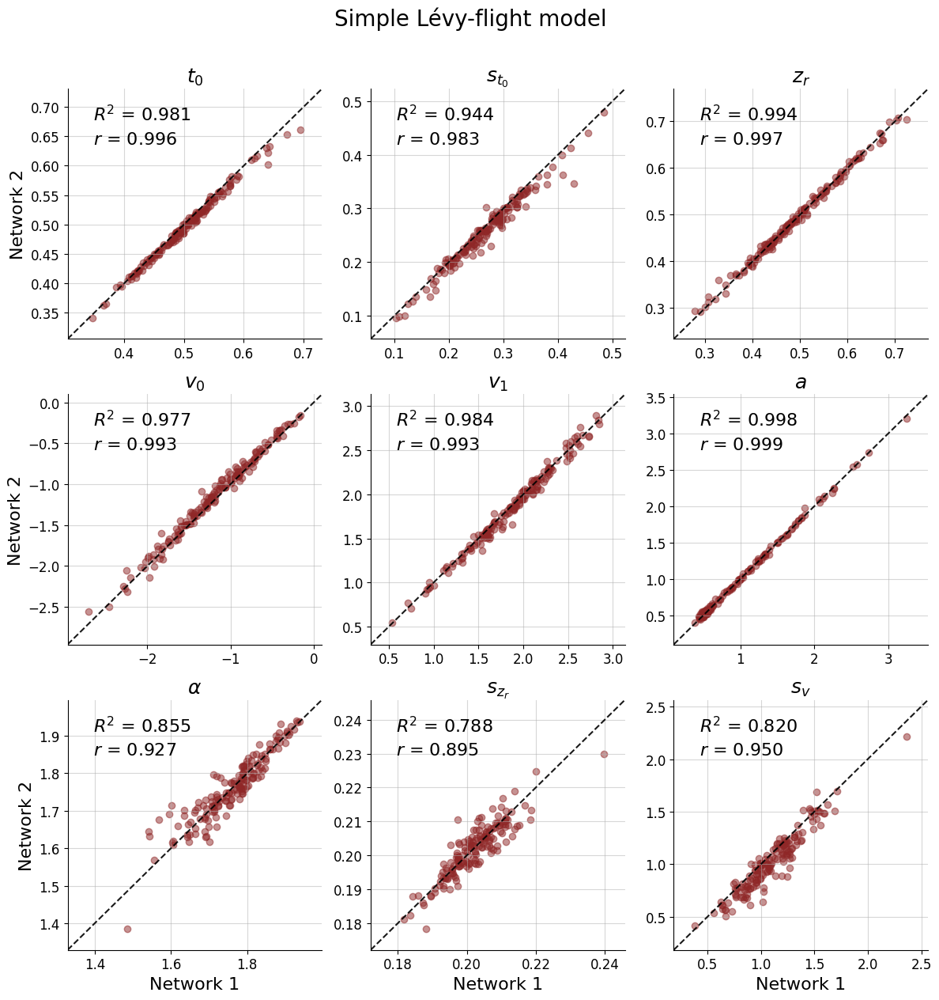

In [53]:
for i, p in enumerate(PRIOR_CONTEXTS):
    for j, s in enumerate(SIMULATOR_CONTEXTS):

        # Load estimates that contain exactly p and s
        net1_pred = pd.read_csv(f"{ESTIM_ROOT_PATH}/estimates_net1_{p}_{s}.csv", 
                        index_col='pp')#.drop(columns=['file', 'condition'], axis=1)
        net2_pred = pd.read_csv(f"{ESTIM_ROOT_PATH}/estimates_net2_{p}_{s}.csv", 
                        index_col='pp')#.drop(columns=['file', 'condition'], axis=1)

        # Common columns to drop
        columns_to_drop = ['file', 'condition']
        
        # Add 'alpha' to the list if p is "ddm"
        if p == "ddm":
            columns_to_drop.append('alpha')
        
        # Drop the columns from both dataframes
        net1_pred = net1_pred.drop(columns=columns_to_drop, axis=1)
        net2_pred = net2_pred.drop(columns=columns_to_drop, axis=1)
               
        my_param_labels = PARAM_LABELS#[:6] + [r"$\alpha$ dummy"] if p == "ddm" else PARAM_LABELS
        
        # Visualize agreement between the two networks
        plot_ensemble_agreement(
            net1_estimates=np.array(net1_pred),
            net2_estimates=np.array(net2_pred),
            xlabel="Network 1",
            ylabel="Network 2",
            param_names=my_param_labels,
            add_corr=True,
            add_r2=True,
            color="#8f2727",
            n_row=3,
            n_col=3
        )
        plt.suptitle(f'Simple {model_map.get(p)} model', fontsize=20, y=1.05)
        #annotation = "A" if p == "levy" else "B"
        #plt.figtext(0.01, 1.01, annotation, fontsize=20, ha='left', fontweight='bold')

        filename = f"figures/s2_agreement_{p}_{s}.png"
        #plt.savefig(filename, transparent=False, bbox_inches='tight', dpi=MY_DPI)

        print(f'{p}; {s}')
        plt.show()

# Goodness of Fit

## Simulate Data 

In [54]:
# Ensure the estimates directory exists
os.makedirs(SIM_ROOT_PATH, exist_ok=True)

for network in range(NUM_ENSEMBLE_MEMBERS):
    for p in PRIOR_CONTEXTS:
        for s in SIMULATOR_CONTEXTS:
            simulates_path = f'{SIM_ROOT_PATH}/simulates_net{network + 1}_{p}_{s}.csv'
            
            if not os.path.exists(simulates_path):
                estimates_path = f'{ESTIM_ROOT_PATH}/estimates_net{network + 1}_{p}_{s}.csv'
                df = pd.read_csv(estimates_path)
                
                all_sim_data = pd.DataFrame()
                for i in range(len(df)):

                    datafile = DATA_PATH + df['file'][i]
                    #print(datafile)
                    raw_data = pd.read_csv(datafile)
                    if ("explicitDeadline" in datafile) & (s == "no_deadline"):
                        raw_data = raw_data.loc[raw_data['RT'] != 0]

                    num_obs = 1000#len(raw_data)
                    
                    theta = df.drop(['file', 'pp', 'condition'], axis=1).to_numpy(copy=True)[i]
                    if p == 'ddm':
                        theta[6] = 2.0
                    deadline = True if s == "deadline" else False
                    sim_data = prior_simulator_functions.ddm_simulator(theta, num_obs, deadline)
                    participant_sim_data = pd.DataFrame({
                        'rts': [rt[0] for rt in sim_data], #First index
                        'symbol': [symbol[1] for symbol in sim_data], #Second index
                        'cond': df['condition'][i],
                        'pp': df['pp'][i]
                    })
            
                    all_sim_data = pd.concat([all_sim_data, participant_sim_data])
                
                all_sim_data.reset_index(drop=True, inplace=True)
                all_sim_data.to_csv(simulates_path, index=False)
                print(f"Saved simulates to {simulates_path}")
            else:
                print(f"{simulates_path} already exists")

estimates_param_estim/simulates_ttj_s2_presimulation_250ep_10000it/simulates_net1_levy_no_deadline.csv already exists
estimates_param_estim/simulates_ttj_s2_presimulation_250ep_10000it/simulates_net2_levy_no_deadline.csv already exists


## Prepare Data

In [55]:
def load_data(directory):
    data = []
    for filename in os.listdir(directory):
        if filename.endswith('.csv'):
            participant_data = pd.read_csv(os.path.join(directory, filename))
            participant_data['file'] = filename
            data.append(participant_data)
    return pd.concat(data, ignore_index=True)

def calculate_timeout(group, simulator="deadline"):
    if group['cond'].iloc[0] == 'explicitDeadline' and simulator == "deadline":
        return group['RT'].isna().sum() / group['RT'].shape[0]
    elif group['cond'].iloc[0] == 'control':
        return -99
    else:
        return group['RT'][group['RT'] > 900].count() / group['RT'].shape[0]
    
def prepare_data(data_type="empirical", calculate_by_symbol=True, return_type="summary", 
                 network=0, p="levy", s="no_deadline"):
    if data_type == "empirical":
        all_data = load_data(directory=DATA_PATH)
        
        # Recode pps
        file_number_pattern = r"file(\d+)_"
        all_data['pp'] = all_data['file'].str.extract(file_number_pattern).astype(int)

        # Recode condition
        condition_pattern = r"_(.+)\.csv"
        all_data['cond'] = all_data['file'].str.extract(condition_pattern)
        all_data['symbol'] = all_data['bright']
        all_data.drop(columns=['file'], inplace=True)
    
    elif data_type == "simulated":
        simulates_path = f'{SIM_ROOT_PATH}/simulates_net{network+1}_{p}_{s}.csv'
        all_data = pd.read_csv(simulates_path)
        all_data['RT'] = all_data['rts']
        all_data = all_data.drop(columns=['rts'])

    all_data['correct'] = np.nan 

    condition1 = (all_data['RT'] < 0) & (all_data['symbol'] == 1)
    condition2 = (all_data['RT'] > 0) & (all_data['symbol'] == 1)
    condition3 = (all_data['RT'] < 0) & (all_data['symbol'] == 0)
    condition4 = (all_data['RT'] > 0) & (all_data['symbol'] == 0)
    all_data.loc[condition1, 'correct'] = 0
    all_data.loc[condition2, 'correct'] = 1
    all_data.loc[condition3, 'correct'] = 1
    all_data.loc[condition4, 'correct'] = 0

    # Add log rts
    all_data.loc[all_data['RT'] == 0, 'RT'] = np.nan
    all_data['RT_log'] = np.log(abs(all_data['RT']))
    
    # Recode rts
    all_data['RT'] = abs(all_data['RT']) * 1000 # Convert to ms

    if data_type == "simulated":
        all_data['origin'] = s
        all_data['model'] = p
    else:
        all_data['origin'] = "empirical"
        all_data['model'] = "none"
        
    if return_type == "raw":
        return all_data
    
    # Calculating statistics
    if calculate_by_symbol:
        group_cols = ['pp', 'symbol', 'cond']
    else:
        group_cols = ['pp', 'cond']

    # Timeout
    timeout_data = all_data.groupby(group_cols).apply(calculate_timeout).reset_index(name='timeout')
    # Accuracy
    accuracy_data = all_data.groupby(group_cols)['correct'].mean().reset_index(name='accuracy')
    # MeanRT
    meanRT_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT'].mean().reset_index(name='meanRT_correct')
    meanRT_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT'].mean().reset_index(name='meanRT_incorrect')
    # MeanRTlog
    meanRTlog_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT_log'].mean().reset_index(name='meanRTlog_correct')
    meanRTlog_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT_log'].mean().reset_index(name='meanRTlog_incorrect')
    # Quantiles
    quantiles_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT'].quantile([0.1, 0.25, 0.3, 0.5, 0.7, 0.75, 0.9]).unstack()
    quantiles_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT'].quantile([0.1, 0.25, 0.3, 0.5, 0.7, 0.75, 0.9]).unstack()
    # Skewness and RT variance
    stats_correct = all_data[all_data['correct'] == 1].groupby(group_cols)['RT'].agg(['skew', 'std']).reset_index()
    stats_correct = stats_correct.rename(columns={'skew': 'skew_correct', 'std': 'stdRT_correct'})
    stats_incorrect = all_data[all_data['correct'] == 0].groupby(group_cols)['RT'].agg(['skew', 'std']).reset_index()
    stats_incorrect = stats_incorrect.rename(columns={'skew': 'skew_incorrect', 'std': 'stdRT_incorrect'})

    # N trials
    ntrials_data = all_data.groupby(group_cols)['RT'].count().reset_index(name='n_trials')

    # Merging results
    result_data = accuracy_data.merge(meanRT_correct, on=group_cols, how='left')
    result_data = result_data.merge(meanRT_incorrect, on=group_cols, how='left')
    result_data = result_data.merge(meanRTlog_correct, on=group_cols, how='left')
    result_data = result_data.merge(meanRTlog_incorrect, on=group_cols, how='left')
    result_data = result_data.merge(quantiles_correct, on=group_cols, how='left')
    result_data = result_data.merge(quantiles_incorrect, on=group_cols, how='left', suffixes=('_correct', '_incorrect'))
    result_data = result_data.merge(stats_correct, on=group_cols, how='left')
    result_data = result_data.merge(stats_incorrect, on=group_cols, how='left')
    result_data = result_data.merge(timeout_data, on=group_cols, how='left')
    result_data = result_data.merge(ntrials_data, on=group_cols, how='left')

    #Add mean RT dff
    result_data['prop_fast_errors'] = (result_data['meanRT_incorrect'] < result_data['meanRT_correct']).astype(int)
    result_data['meanRTdiff'] = result_data['meanRT_correct']-result_data['meanRT_incorrect']
    result_data['meanRTlogdiff'] = result_data['meanRTlog_correct']-result_data['meanRTlog_incorrect']
   
    if data_type == "simulated":
        result_data['origin'] = s
        result_data['model'] = p
    else:
        result_data['origin'] = "empirical"
        result_data['model'] = "none"

    return result_data

## Behavioral Results

In [56]:
all_empirical_data = prepare_data(data_type="empirical", calculate_by_symbol=True, return_type="raw")
result_empirical = prepare_data(data_type="empirical", calculate_by_symbol=True, return_type="summary")
result_empirical_osy = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="summary") 

In [57]:
result_empirical_osy['n_trials'].min()

299

In [58]:
file_path = "ttj_s2_result_empirical_wsy.csv"

if not os.path.isfile(file_path):
    result_empirical.to_csv(file_path, index=False)
    print(f"File created: {file_path}")
else:
    print(f"File already exists: {file_path}")

File already exists: ttj_s2_result_empirical_wsy.csv


In [59]:
behavioral_params = ["meanRT_correct", "meanRT_incorrect", "accuracy", #"meanRTdiff",
                     "timeout", "skew_correct"]
summary_table = (
    result_empirical_osy.groupby(['cond'], observed=True)[behavioral_params]
    .agg(['mean', 'std'])
    .round(2)
    .reset_index()
)
summary_table

cond meanRT_correct         meanRT_incorrect         accuracy  \
                              mean     std             mean     std     mean   
0           control         886.37  248.92          1039.99  360.44     0.80   
1  explicitDeadline         579.90   37.26           598.90   47.33     0.73   

        timeout       skew_correct       
    std    mean   std         mean  std  
0  0.05  -99.00  0.00         1.28  0.4  
1  0.07    0.04  0.02         0.41  0.2

In [60]:
long_df = summary_table.melt(id_vars='cond', var_name=['param', 'stat'])
pivoted = long_df.pivot(index='cond', columns=['param', 'stat'], values='value')
combined = pd.DataFrame()
for param in pivoted.columns.levels[0]:
    mean = pivoted[(param, 'mean')].round(2)
    std = pivoted[(param, 'std')].round(2)
    combined[param] = mean.astype(str) + ' (' + std.astype(str) + ')'
transposed_summary = combined.T.reset_index()
transposed_summary.columns = ['param'] + list(combined.index)
reordered_rows = transposed_summary.iloc[[1, 2, 0, 4, 3]]
transposed_summary = reordered_rows
transposed_summary

,param,control,explicitDeadline
1,meanRT_correct,886.37 (248.92),579.9 (37.26)
2,meanRT_incorrect,1039.99 (360.44),598.9 (47.33)
0,accuracy,0.8 (0.05),0.73 (0.07)
4,timeout,-99.0 (0.0),0.04 (0.02)
3,skew_correct,1.28 (0.4),0.41 (0.2)


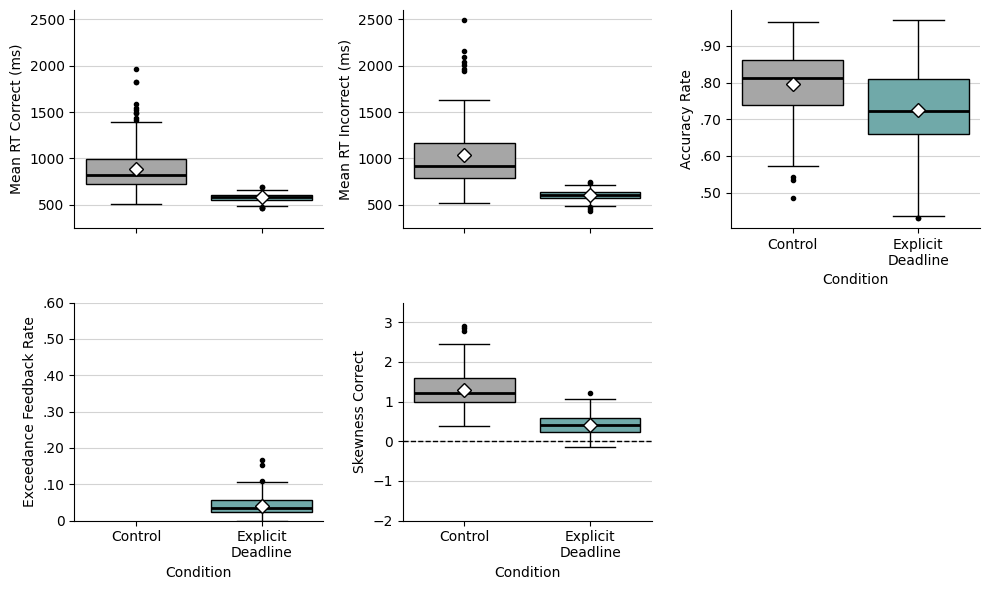

In [61]:
fancy_labels = ["Mean RT Correct (ms)", "Mean RT Incorrect (ms)", 
                "Accuracy Rate",
                "Exceedance Feedback Rate", "Skewness Correct"]

fig, axes = plt.subplots(2, 3, figsize=(10, 6))  
axes = axes.flatten()  

for i, param in enumerate(behavioral_params):
    ax = axes[i]  

    sns.boxplot(
        x='cond', hue="cond", y=param, data=result_empirical, order=condition_order, palette=palette, ax=ax,
        flierprops=dict(marker='o', markerfacecolor='black', markeredgecolor='black', markersize=3),
        boxprops=dict(edgecolor="black"),
        whiskerprops=dict(color="black"),
        capprops=dict(color="black"),
        medianprops=dict(color="black", linewidth=2)
    )
    
    ax.set_ylabel(fancy_labels[i])  

    ax.set_xticks(range(len(condition_labels)))
    
    if i < 2:
        ax.set_xticklabels([])
        ax.set_xlabel('')
    else:
        ax.set_xticklabels([label.replace(" ", "\n") for label in condition_labels])
        ax.set_xlabel('Condition')

    means = result_empirical.groupby('cond')[param].mean()
    for k, condition in enumerate(condition_order):
        mean_value = means[condition]
        ax.plot(k, mean_value, 'D', color='white', markersize=7, markeredgecolor='black', zorder=3)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(True, which='major', axis='y', color='lightgrey')

    if param in ["meanRT_correct", "meanRT_incorrect"]:
        ax.set_ylim([250, 2600])

    if param in ["skew_correct", "skew_incorrect"]:
        ax.set_ylim([-2, 3.5])
        ax.axhline(0, color='black', linestyle='--', linewidth=1)

    if param == "timeout":
        ax.set_ylim([0, 0.6])

    if param in ["accuracy", "timeout"]:
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))

for j in range(len(behavioral_params), len(axes)):
    fig.delaxes(axes[j])  

plt.tight_layout()
#plt.savefig("figures/s2_behav.png", transparent=True, dpi=MY_DPI)
plt.show()

control


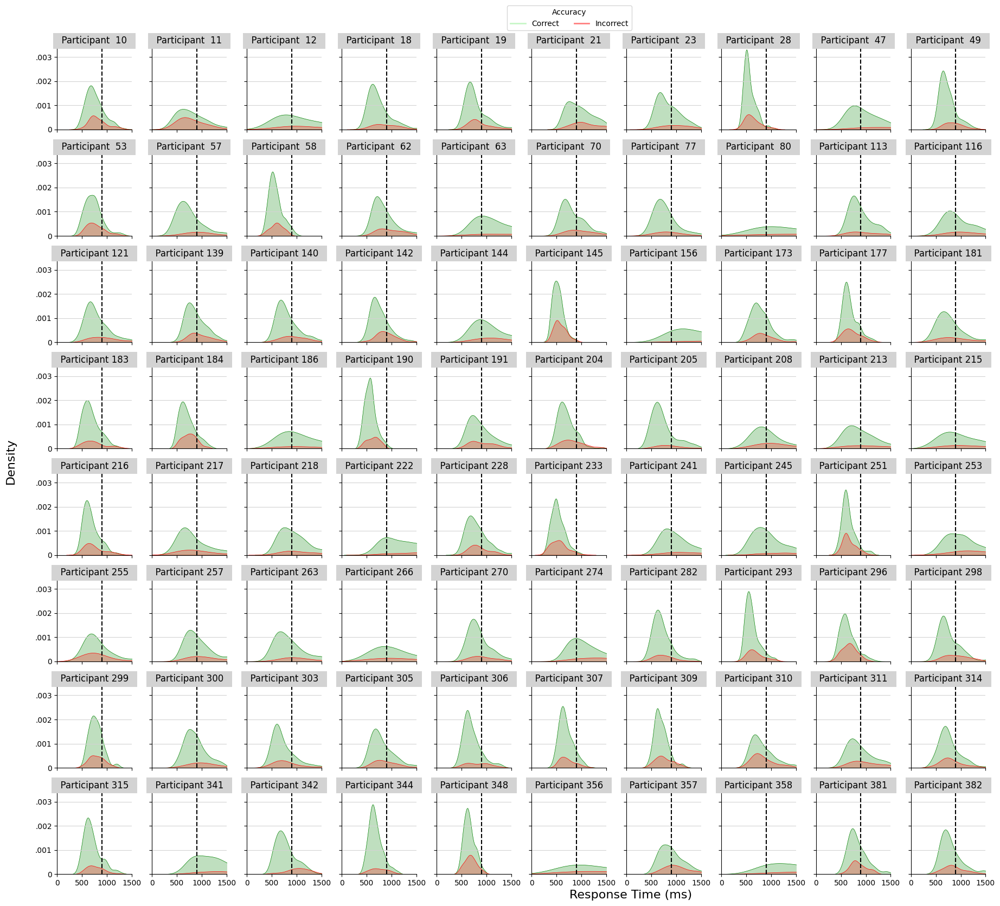

explicitDeadline


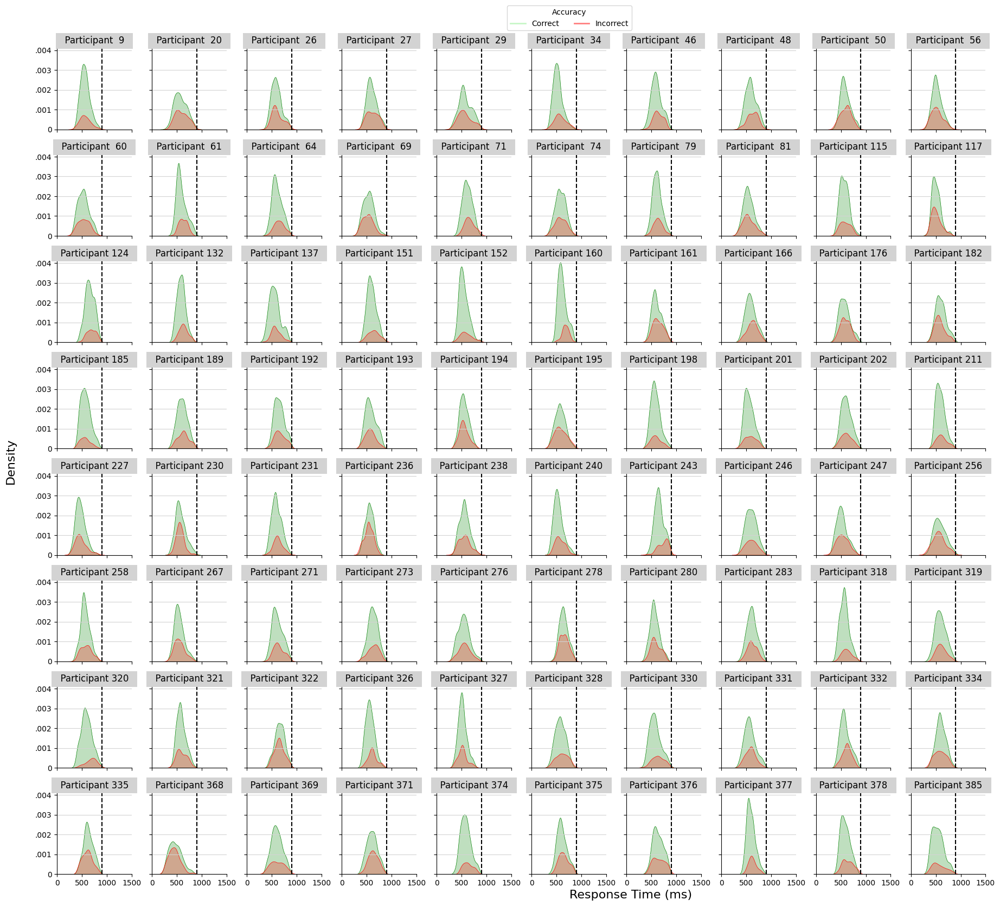

In [62]:
def plot_participant_rts(df, cols=10, my_font_size=16, LL_x=0, 
                         UL_x=1500, network=None, cond=None):
    simulator_map = {"deadline": "deadline", "no_deadline": "no deadline"}
    condition_map = {"control": "control", "explicitDeadline": "explicit deadline"}

    participants = sorted(df['pp'].unique())
    rows = (len(participants) + cols - 1) // cols  
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(2*cols, 2*rows), sharex=True, sharey=True)
    axes = axes.flatten()
    
    # Plot each participant in a separate subplot
    for idx, participant in enumerate(participants):
        ax = axes[idx]
        pp_df = df[df['pp'] == participant]
        part_df = pp_df[pp_df['origin'] != 'deadline']
        
        data_emp = part_df[(part_df['origin'] == 'empirical')]
        sns.kdeplot(data=data_emp, x='RT', hue="correct", linestyle='-', 
                    palette={0.0: 'red', 1.0: 'green'}, ax=ax, lw=0.5, label='Empirical',
                    fill=True, legend=False)
        ax.axvline(x=900, color='black', linestyle='--') 
    
        # Title 
        if participant < 100:
            leerzeichen = ' '
        else:
            leerzeichen = ''
        title_text = f'  Participant {leerzeichen}{participant}  '
        ax.set_title(title_text, fontsize=my_font_size-4, pad=0, loc='center',
                      bbox=dict(facecolor='lightgrey', edgecolor='none'))
        
        ax.set_xlim([LL_x, UL_x])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=3)))
        ax.grid(True, which='major', axis='y', color='lightgrey', zorder=0) 

    fig.text(0.5, 0.0, 'Response Time (ms)', va='center', rotation='horizontal', fontsize=my_font_size)
    fig.text(-0.02, 0.5, 'Density', va='center', rotation='vertical', fontsize=my_font_size)

    legend_elements = [
        mlines.Line2D([0], [0], color='lightgreen', lw=2, label='Correct', alpha=0.5),
        mlines.Line2D([0], [0], color='red', lw=2, label='Incorrect', alpha=0.5),
    ]
    
    fig.legend(handles=legend_elements, loc='upper center', title="Accuracy", bbox_to_anchor=(0.5, 1.03), ncol=2)

    for ax in axes[len(participants):]:
        ax.axis('off')

    plt.tight_layout(rect=[0, 0, 0.9, 1])  
    #plt.savefig(f"figures/s2_pp_rt_distributions_emp_{cond}.png", dpi=MY_DPI, bbox_inches="tight")
    plt.show()

for cond in conditions:
    print(cond)
    empirical_data_raw = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="raw")
    empirical_data_raw_cond = empirical_data_raw[empirical_data_raw['cond'] == cond]
    plot_participant_rts(empirical_data_raw_cond, my_font_size=16, network=network, cond=cond)

In [63]:
for cond in conditions:
    empirical_data_raw = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="raw")
    empirical_data_raw_cond = empirical_data_raw[empirical_data_raw['cond'] == cond]
    perc = (empirical_data_raw_cond['RT'] > 1500).sum() / len(empirical_data_raw_cond['RT'])*100
    print(cond, perc.round(2))

control 8.74
explicitDeadline 0.0


## Scatter Plots

In [64]:
my_font_size = 12
my_marker_size = 15
p_marker_alpha = 0.5
p_map = {"levy": "#073eb0", "ddm": "#f59827"}
p_alpha = 1

condition_map = {"control": "Control Condition", "explicitDeadline": "Explicit Deadline Condition"}

In [65]:
def add_modelwise_r_squared(ax, data, empirical_col, simulation_col, fontsize, fontcolor=None, 
                            subscript1="LFM", subscript2="DM", y_pos=0.95):
    y_pos = y_pos
    line_spacing = 0.1  

    for model in PRIOR_CONTEXTS:
        subscript = subscript1 if model == 'levy' else subscript2
        r_squared_label = rf'R^2_{{\mathrm{{{subscript}}}}}'

        subset = data[data['model_simulation'] == model]
        emp = subset[empirical_col]
        sim = subset[simulation_col]
        mask = emp.notna() & sim.notna()

        if mask.any():
            r = emp[mask].corr(sim[mask])
            if pd.notna(r):
                r_squared = r ** 2

                if round(r_squared, 2) == 0:
                    r_squared_str = '0'
                elif abs(round(r_squared, 2)) == 1:
                    r_squared_str = '1'
                elif 0 < abs(r_squared) < 1:
                    r_squared_str = f'{r_squared:.2f}'.replace('0.', '.')
                else:
                    r_squared_str = f'{r_squared:.2f}'

                text = rf'${r_squared_label} = {r_squared_str}$'

                ax.text(0.05, y_pos, text,
                        transform=ax.transAxes,
                        fontsize=fontsize,
                        verticalalignment='top',
                        horizontalalignment='left',
                        color=fontcolor if fontcolor else p_map[model])
                
                y_pos -= line_spacing

In [66]:
def plot_panel(ax, data, x, y, title, lims, hue=None, alpha=0.5,
               palette=None, color="#073eb0",
               marker="o", marker_size=30,
               xlabel="Empirical", ylabel="Predicted"):

    if hue is None:
        sns.scatterplot(
            data=data, x=x, y=y,
            color=color,
            marker=marker,
            ax=ax,
            alpha=alpha,
            legend=False,
            s=marker_size
        )
    else:
        sns.scatterplot(
            data=data, x=x, y=y,
            hue=hue,
            palette=palette,
            marker=marker,
            ax=ax,
            alpha=alpha,
            legend=False,
            s=marker_size
        )

    ax.plot(lims, lims, 'k-', lw=2)

    if hue is None:
        sub = data[[x, y]].dropna()
        if not sub.empty:
            X = sub[[x]].values
            y_vals = sub[y].values
            reg = LinearRegression().fit(X, y_vals)

            x_line = np.linspace(lims[0], lims[1], 100).reshape(-1, 1)
            y_line = reg.predict(x_line)
            ax.plot(x_line, y_line, color=color, linewidth=2, alpha=0.4)
    else:
        for level in data[hue].dropna().unique():
            sub = data.loc[data[hue] == level, [x, y]].dropna()
            if sub.empty:
                continue

            X = sub[[x]].values
            y_vals = sub[y].values
            reg = LinearRegression().fit(X, y_vals)

            x_line = np.linspace(lims[0], lims[1], 100).reshape(-1, 1)
            y_line = reg.predict(x_line)

            line_color = palette[level] if isinstance(palette, dict) else None
            ax.plot(x_line, y_line, color=line_color, linewidth=2, alpha=0.4)

    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title, fontsize=my_font_size + 2)

    if x != "skew_correct_empirical":
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))
    if (x == "accuracy_empirical") or (x == "timeout_empirical"):
        ax.xaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=2)))

    ax.grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.tick_params(axis='both', which='both', bottom=True, top=False, left=True, right=False,
                   width=0.5, direction='out')

Network 1


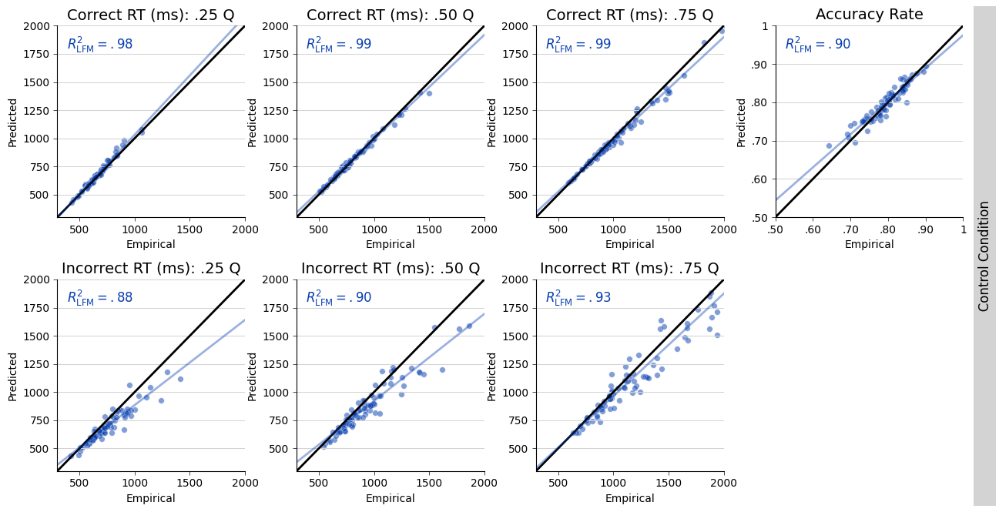

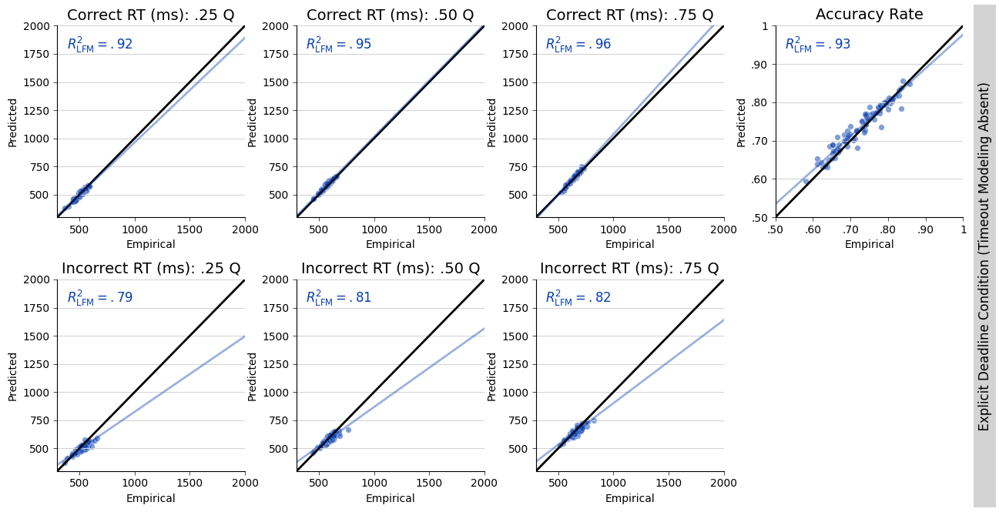

Network 2


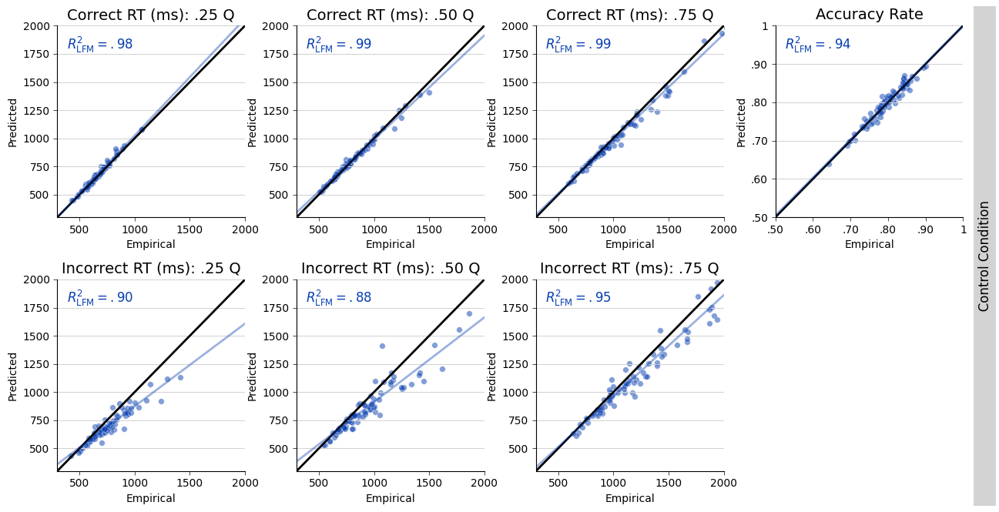

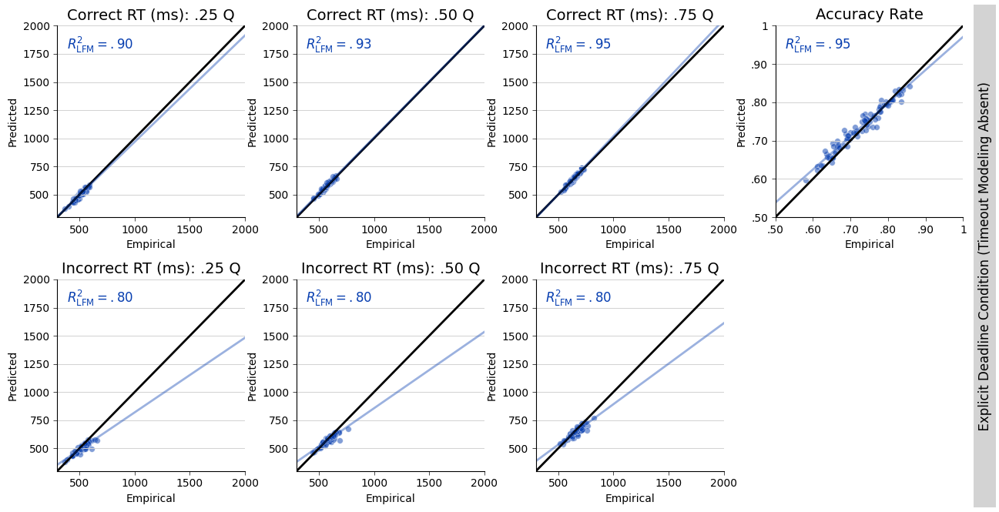

In [67]:
p_map = {'levy': "#073eb0", "ddm": "#f59827"}

quantile_labels   = ["0.25", "0.5", "0.75"]
quantile_headings = [".25", ".50", ".75"]

for network in range(NUM_ENSEMBLE_MEMBERS):
    print("Network", network + 1)

    # Simulated: levy only
    result_simulated = prepare_data("simulated", 0, "summary", network=network, p="levy")

    for cond in condition_order:
        emp = result_empirical_osy[result_empirical_osy["cond"] == cond]
        sim = result_simulated[result_simulated["cond"] == cond]
        merged = pd.merge(emp, sim, on=["pp", "cond"],
                          suffixes=("_empirical", "_simulation"))

        fig, axs = plt.subplots(2, 4, figsize=(12.75, 7.5))

        # --- Correct RTs ---
        for i, q in enumerate(quantile_labels):
            emp_col = f"{q}_correct_empirical"
            sim_col = f"{q}_correct_simulation"
            if emp_col not in merged.columns or sim_col not in merged.columns:
                continue

            plot_panel(
                axs[0, i], merged,
                x=emp_col, y=sim_col,
                title=f"Correct RT (ms): {quantile_headings[i]} Q",
                lims=[300, 2000],
                hue=None,
                palette=p_map,
                alpha=p_marker_alpha
            )
            add_modelwise_r_squared(axs[0, i], merged, emp_col, sim_col, 
                                    fontsize=my_font_size, fontcolor="#073eb0")

        # --- Incorrect RTs ---
        for i, q in enumerate(quantile_labels):
            emp_col = f"{q}_incorrect_empirical"
            sim_col = f"{q}_incorrect_simulation"
            if emp_col not in merged.columns or sim_col not in merged.columns:
                continue

            plot_panel(
                axs[1, i], merged,
                x=emp_col, y=sim_col,
                title=f"Incorrect RT (ms): {quantile_headings[i]} Q",
                lims=[300, 2000],
                hue=None,
                palette=p_map,
                alpha=p_marker_alpha
            )
            add_modelwise_r_squared(axs[1, i], merged, emp_col, sim_col, 
                                    fontsize=my_font_size, fontcolor="#073eb0")

        # --- Accuracy ---
        plot_panel(
            axs[0, 3], merged,
            x="accuracy_empirical", y="accuracy_simulation",
            title="Accuracy Rate",
            lims=[0.5, 1.0],
            hue=None,
            palette="black",
            alpha=p_marker_alpha
        )
        add_modelwise_r_squared(axs[0, 3], merged,
                                "accuracy_empirical", "accuracy_simulation",
                                fontsize=my_font_size, fontcolor="#073eb0")
        
        axs[1, 3].axis("off")

        spacer_map = {"control": " " * 47,
                "explicitDeadline": " " * 18}
        spacer = spacer_map.get(cond, "")
        add_timeout = ""
        if cond == "explicitDeadline":
            if s == "no_deadline":
                add_timeout = " (Timeout Modeling Absent)"
            elif s == "deadline":
                add_timeout = " (Timeout Modeling Present)"

        fig.text(1.0, 0.45, f"{spacer}{condition_map.get(cond)}{add_timeout}{spacer}",
                     va='center', ha='left', rotation='vertical', bbox=dict(facecolor='lightgrey', edgecolor='none'),
                     fontsize=my_font_size)

        plt.tight_layout(rect=[0, 0.0, 1, 0.9])
        plt.subplots_adjust(wspace=0.275, hspace=0.325)
        plt.savefig(f"figures/s2_scatterplot2_quartiles_R2_net{network+1}_{cond}_{s}.png", 
                        transparent=False, bbox_inches="tight", dpi=MY_DPI)
        plt.show()

In [68]:
result_simulated = prepare_data("simulated", 0, "summary", network=network, p="levy")

for cond in condition_order:
    emp = result_empirical_osy[result_empirical_osy["cond"] == cond]
    sim = result_simulated[result_simulated["cond"] == cond]
    merged = pd.merge(emp, sim, on=["pp", "cond"], suffixes=("_empirical", "_simulation"))

## Error Profiles and Cross-Participant RT Distributions

In [69]:
network = 0
all_empirical_data2 = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="summary", )
levy_data_no_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="summary", 
                 network=network, p="levy", s="no_deadline")

df = pd.concat([all_empirical_data2, levy_data_no_deadline])

In [70]:
for model in PRIOR_CONTEXTS:
    print("---", model, "---")
    levy_data_no_deadline = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="summary", 
                 network=network, p=model, s="no_deadline")
    df = pd.concat([all_empirical_data2, levy_data_no_deadline])
    for cond, sub in df.groupby("cond"):
        print(f"\nCondition: {cond}")
        
        emp = sub[sub["origin"] == "empirical"]
        sim = sub[sub["origin"] != "empirical"]
    
        p_emp = (emp["meanRTdiff"] < 0).mean()*100
        p_sim = (sim["meanRTdiff"] < 0).mean()*100
        m_emp = emp["meanRTdiff"].mean()
        m_sim = sim["meanRTdiff"].mean()
    
        print(f"percentages: {p_emp:.2f} emp, {p_sim:.2f} sim")
        print(f"means of meanRTdiffs: {m_emp:.2f} emp, {m_sim:.2f} sim")

--- levy ---

Condition: control
percentages: 100.00 emp, 93.75 sim
means of meanRTdiffs: -153.62 emp, -107.25 sim

Condition: explicitDeadline
percentages: 80.00 emp, 67.50 sim
means of meanRTdiffs: -19.00 emp, -3.58 sim


In [71]:
def plot_grouped_conditions_rts(network, conditions=condition_order,
                                t_linestyle=":",
                                my_font_size=14, LL_x=100, UL_x=1400, UL_y=.005,
                                p_alpha=0.7, plot_hue=False, plot_deadline=False):
    print("Network", network+1)

    levy_color = "#073eb0"
    ddm_color = "#f59827"
    emp_color = "black"
    my_marker_size = 9
    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(6.6, 4), sharey=True)

    for s in SIMULATOR_CONTEXTS:
        if s == 'no_deadline':
            for idx, cond in enumerate(conditions):
                ax = axes[idx]

                all_empirical_data = prepare_data(data_type="empirical", calculate_by_symbol=False, return_type="raw", )
                lfm_data = prepare_data(data_type="simulated", calculate_by_symbol=False, return_type="raw", 
                                        network=network, p="levy", s="no_deadline")
                df = pd.concat([all_empirical_data, lfm_data])
                
                cond_df = df[(df['cond'] == cond) & (df['origin'] != 'deadline')]
                if not plot_hue:
                    cond_df = cond_df[cond_df["correct"] == 1]

                # Empirical data
                empirical_data = cond_df[cond_df['origin'] == 'empirical']
                sns.kdeplot(data=empirical_data, x='RT',
                            hue="correct" if plot_hue else None,
                            palette={0.0: emp_color, 1.0: emp_color} if plot_hue else None,
                            color=None if plot_hue else emp_color,
                            ax=ax, lw=0, label='Empirical',
                            legend=False, alpha=.14, fill=1)
                
                # Simulated data by Levy
                levy_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'levy')]
                sns.kdeplot(data=levy_data, x='RT',
                            hue="correct" if plot_hue else None,
                            palette={0.0: levy_color, 1.0: levy_color} if plot_hue else None,
                            color=None if plot_hue else levy_color,
                            linestyle='-', fill=0, alpha=p_alpha,
                            ax=ax, lw=2, label='Levy', legend=False)
                ax.set_title(f'{condition_map.get(cond)}', fontsize=14)

                if idx == 2:
                    cond_df = df[(df['cond'] == cond) & (df['origin'] != 'no_deadline')]
                    if not plot_hue:
                        cond_df = cond_df[cond_df["correct"] == 1]
                    
                    # Simulated data by Levy
                    levy_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'levy')]
                    sns.kdeplot(data=levy_data, x='RT',
                                hue="correct" if plot_hue else None,
                                palette={0.0: levy_color, 1.0: levy_color} if plot_hue else None,
                                color=None if plot_hue else levy_color,
                                linestyle=t_linestyle, ax=ax, lw=2,
                                label='Levy Simulated', legend=False)
                    
                    # Simulated data by DDM
                    ddm_data = cond_df[(cond_df['origin'] != 'empirical') & (cond_df['model'] == 'ddm')]
                    sns.kdeplot(data=ddm_data, x='RT',
                                hue="correct" if plot_hue else None,
                                palette={0.0: ddm_color, 1.0: ddm_color} if plot_hue else None,
                                color=None if plot_hue else ddm_color,
                                linestyle=t_linestyle, ax=ax, lw=2,
                                label='DDM Simulated', legend=False)
                    if plot_deadline:
                        ax.axvline(x=900, color='black', linestyle='--', linewidth=1) 

    for ax in axes:
        ax.grid(True, axis='y', color='lightgrey', linestyle='-', linewidth=0.75, zorder=0)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlim([LL_x, UL_x])
        ax.set_ylim([0, UL_y])
        ax.set_xlabel('Correct Response Time (ms)' if not plot_hue else 'Reaction Time (ms)')
        ax.tick_params(axis='both', which='both', bottom=True, top=False, left=True, right=False, length=5, width=1, direction='out')
        ax.yaxis.set_major_formatter(FuncFormatter(apa_tick_formatter(digits=3)))
        #ax.set_xticks([200, 400, 600, 800])

    legend_elements_color = [
        mlines.Line2D([0], [0], marker='s', color='None', label='Empirical',
                      markeredgecolor="None", markerfacecolor=emp_color, markersize=my_marker_size-2, alpha=.35),
        mlines.Line2D([0], [0], marker='s', color='None', label='Full LFM',
                      markeredgecolor="None", markerfacecolor=levy_color, markersize=my_marker_size-2, alpha=p_alpha)
    ]
    
    fig = plt.gcf()
    fig.legend(handles=legend_elements_color, title="Data Origin", loc='upper left', bbox_to_anchor=(0.35, 1.14), ncol=3)

    plt.tight_layout()
    suffix = "corr" if not plot_hue else "all"
    plt.savefig(f"figures/s2_dist_{suffix}_rts_combined_net{network+1}.png", bbox_inches='tight', transparent=True, dpi=MY_DPI)
    plt.show()

Network 1


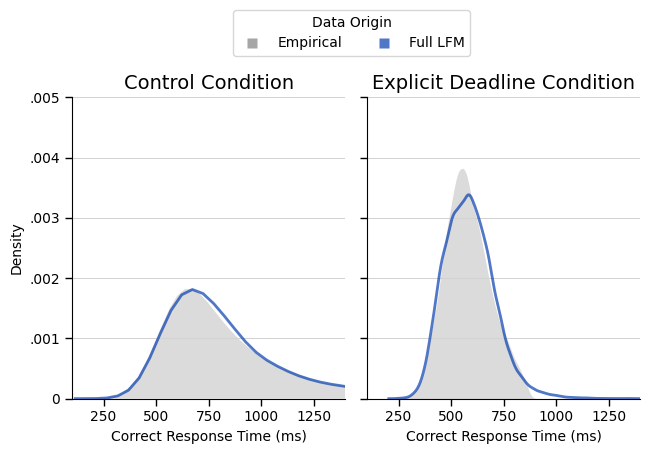

Network 2


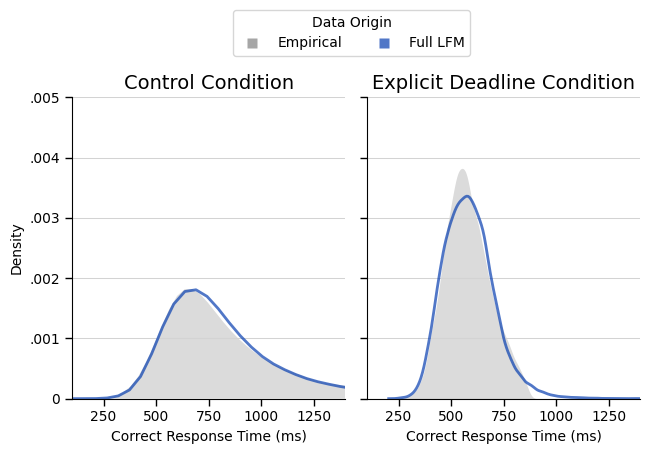

In [72]:
plot_grouped_conditions_rts(network=0)
plot_grouped_conditions_rts(network=1)